In [ ]:
#Alex Butler 21338787
#Mark Harrison 21335265
#code executes to the end without error
#refrences:
  #EfficientNet source: https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet
  #ResNet source: https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet


In [ ]:
#get the packages
!pip install pandas
!pip install -q kaggle
!pip install tensorflow
!pip install keras
!pip install seaborn
!pip install pydot
!pip install memory_profiler

# The Data Set
##- Visualisation of some of the key attributes
Our dataset, Fruits-360, was selected from Kaggle, and can be accessed at this link:
https://www.kaggle.com/datasets/moltean/fruits
The dataset features 141 different classifications of fruit, each type of fruit having images of the fruit at various angles.

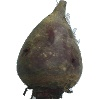
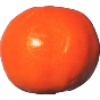
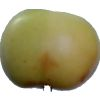
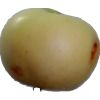

The dataset is split into two folders, for training and for testing. There is a total of 141 classes. There are 94,110 images total, with 70491 being for training and 23619 being for testing.

The goal for our CNN was to create two models which were capable of processing an image of fruit, and classifying it into a specific class.

We chose this dataset as it is very verbose and contains very few outliers. Our CNNs will not only be able to classify an image as a fruit (e.g. Apple) but as a specific type of that fruit (e.g.Apple Braeburn or Apple Granny Smith). The larger number of images allows the CNN to classify the inputs into these classes accurately.
##- Data Correlation and feature engineering if applicable
Over the course of this project we experimented with many methods of pre-processing this data. We tried to combine many of the classes into a smaller number of classes. For example, each of the ampple tyles (Apple Braeburn, Apple Granny Smith, etc) would be concatenated into just Apple. This reduced the class size from 141 to around 71. In the end, we decided to keep the original 141 classes as the models proved capable of handling classification into a large number of categories.
  
##- Any pre-processing such as normalisation applied to the data
Before the dataset is fed into the models, we cull the size randomly in these lines
```
trainResNet = training_dataset.take(train_card)
validationResNet = val_dataset.take(30)
testResNet = training_dataset.skip(train_card).take(30)
```
This means we are only feeding some of the 94k images into the mode. The train_card constant determines the number of batches being taken,and the size of each batch is determined by the BATCH_SZ constant. For example, when BATCH_SZ is 32 and train_card is 160, trainResNet contains 160 batches of 32 images for training, and 30 batches of 32 images for testing. We skip the first 160 batches for testResNet before taking 30 batches of 32 so there is no overlap between the data in the training and testing sets. Because the dataset is shuffled, rerunning the program guarantees different data being fed in.

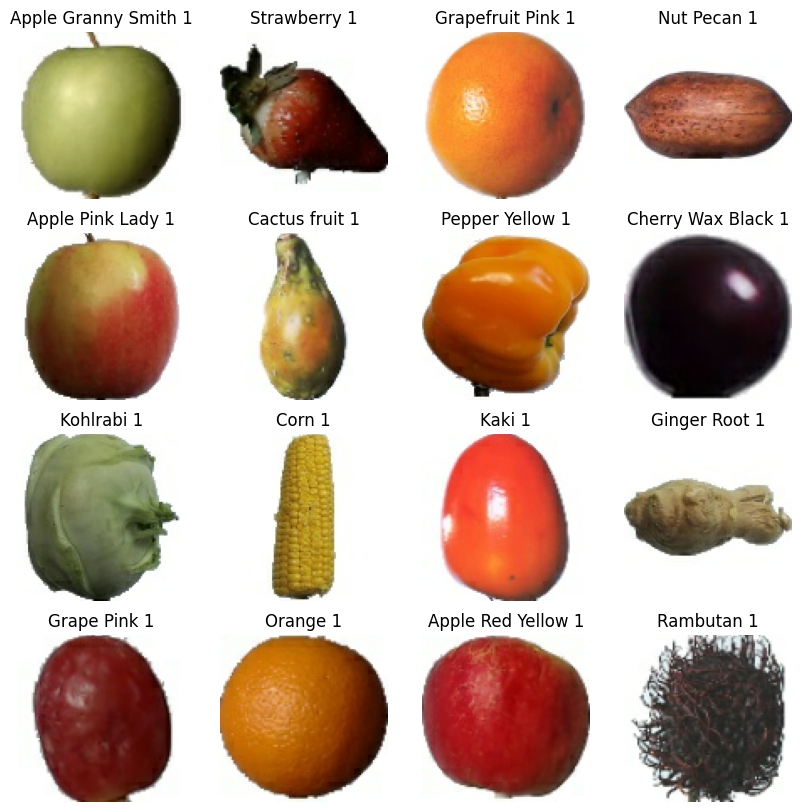

Afterwards, each image is normalized, we divide the value of each pixel by 255, placing each pixel's value in a range between 0 and 1

In [ ]:
!kaggle datasets download moltean/fruits


Dataset URL: https://www.kaggle.com/datasets/moltean/fruits
License(s): CC-BY-SA-4.0
100% 964M/964M [00:44<00:00, 23.4MB/s]
100% 964M/964M [00:44<00:00, 22.7MB/s]


In [ ]:
!unzip /content/fruits.zip -d /content/fruits

Streaming output truncated to the last 5000 lines.
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r0_96.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r0_98.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_0.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_10.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_100.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_102.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_104.jpg  
  inflating: /content/fruits/fruits-360_dataset_original-s

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
from keras import layers, models
from tensorflow.keras.layers import Conv2D, DepthwiseConv2D, Dense, GlobalAveragePooling2D, BatchNormalization, Activation, Add, Multiply, Reshape,Input
from tensorflow.keras import Model
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import shutil
import os
import collections
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import KFold

## Network Structures and Hyperparameters
Our two Models are ResNet152 and EfficientNetB0.

# ResNet152
Resnet is a deep convolutional neural network proposed by Microsoft in 2015. Multiple residual blocks compose the network, and the model is concerned with optimizing a residual function.

ResNet-152 uses residual learning, which allows it to train very deep neural network. Residual learning addresses the vanishing gradients that occur in complex networks as a model trains on more data. It is able to skip certain connections or jump over layers in a network. This makes it suitable for handling large and complex datasets such as the fruits-360 set.

The below image breaks down the network architecture of ResNet-152, compared to another model like VGG_19 on the left.[1]
https://www.run.ai/guides/deep-learning-for-computer-vision/pytorch-resnet

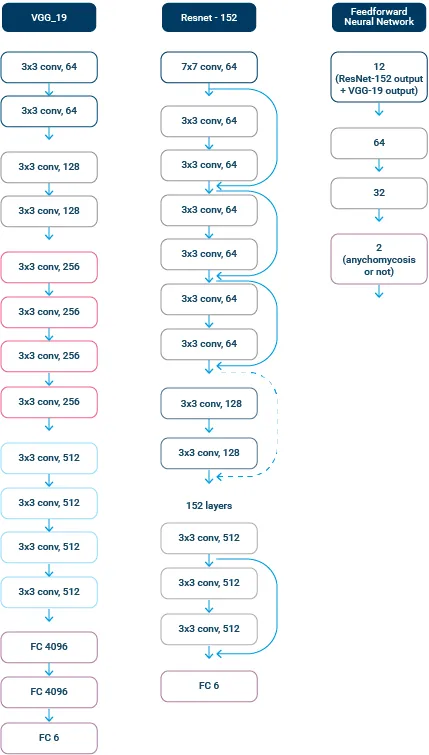
## EfficientNetB0

EfficientNet is the Convolutional Neural Network model we decided upon for our second model. It uses some unique design features to be extremly memory and compunationally effient:
Compound scaling, which is a method for efficiently increasing the size and capacity of a neural network. Instead of simply increasing depth, width, or resolution individually, it scales all dimensions proportionally using a set of fixed scaling coefficients.
MBConv, (Mobile Inverted Bottleneck Convolution), uses depthwise convolutions to process each input channel separately, reducing computation. Then, it employs a 1x1 convolution to combine these outputs, creating new features. This producesn "inverted bottleneck" structure that expands and then reduces the data flow, minimizing memory usage. This combination of techniques enables MBConv to be both computationally efficient and accurate for image processing.

 allowing it to perform with high accuracy and computational efficiency. The design philosophy behind EfficientNet is to have highly accurate classification performed at a quick speed, allowing it to be used in many real time applications where classification may be needed quickly, and portable devices where the lesser computational power provided by these devices would be limited.

We chose this model because it is good for handling datasets at high speed and accuracy, and therefore was quite different from ResNet's slower training times but ability to handle incredibly large/complex data at high accuracy. Our aim is to compare and contrast these two models which fill two different, opposite use cases.

Using these defined modules
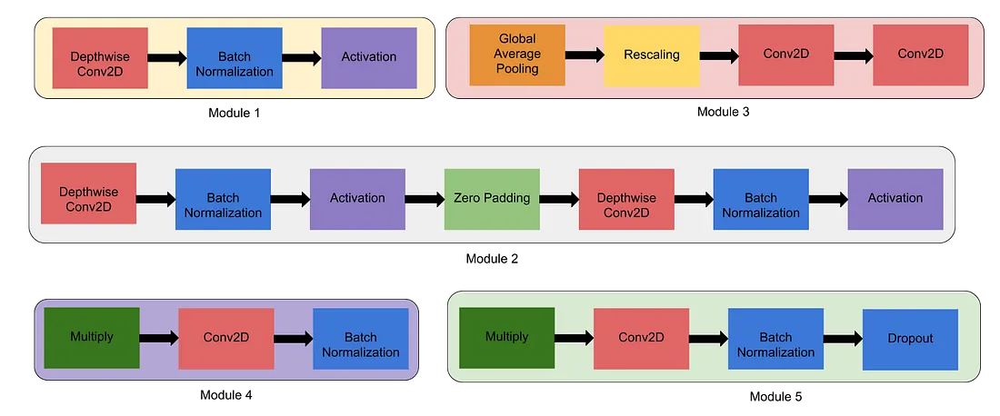

We can define the EfficientNetB0 architecture as follows

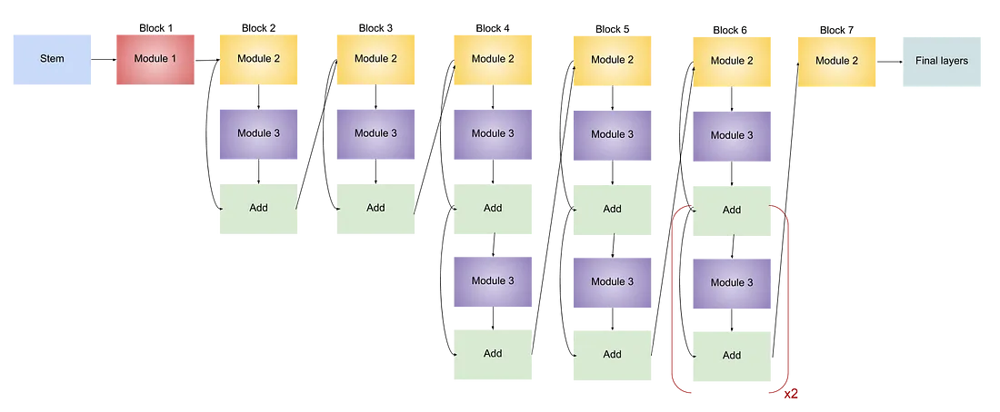

https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142

## Hyperparameters
- Batch Size: Batch Size is set to 32 , this means that each batch taken by the model will contain 32 images
- Epochs: After having epochs set to 20 across both models, which was satisfactory for EfficientNetB0 to plateau, but ResNet had yet to stop learning, so the epoch number was set to 30, to account for this. We kept hyperparameters and preconditions the same between both models to better compare and contrast them.
- Training Cardinality: This is how we shrink the dataset size. Training Cardinality is set to 126, so the model only trains off of 126 batches of 32 images (as determined by the batch size).
- Weight Initialisation: Initially we used Imagenet pretrained weights, but found that this wasn't producing satisfying results, as there is little overlap between imagnet and these images, meaning that transfer learning massivly slowed training, so we have switched to using weights initialized from scratch. This produced better results.
- Activation function: Several activation functions are used within these models. Leaky ReLU is used in the top dense layers that we added to the top of the model, softmax is applied in the final layer to output a probability for the classification and within ResNet ReLU is used additionally by default. LeakyReLU prevents vanishing gradients,  allowing weights below zero to still get propagated backward. EffecientNet uses the  SiLU (Swish-1) activation function which is smoth and monotic and performs very well in deep networks
- Batch Normaliation: ResNet152 has batch normalisation inherent in its architecture, stabalizing learning and speeding up convergence.
- Regularisation: Our optimiser, AdamW has a weight decay regularization set to 1 x e-6. Initially it was set to 1e-5, but changing this value provided better performance and minimized oscillation.
- Residual Learning: ResNet152 uses skip/residual connections to bypass certain layers, which stops gradients vanishing. THe model uses residual mappings, making it efficient for training deep networks.
- The EfficientNet has a callback to cause the learning rate to have a more agressive reduction if the validation loss does not improve after 5 epochs

In [ ]:
#constants to keep parameters consistent between models
N_CLASSES = 141
BATCH_SZ = 32
IMG_SZ = 100
IMG_SHAPE = (IMG_SZ,IMG_SZ)
INP_SHAPE = (IMG_SZ,IMG_SZ,3)
EPOCHS = 30
epochs_r = range(1, EPOCHS + 1)#for graphing puroses
train_card = 126#shrinks dataset size
FOLDS = 7
test_card = FOLDS*30

normilzing to [0-1] is better because the smaller values are more suited to activation functions (https://machinelearningmastery.com/how-to-manually-scale-image-pixel-data-for-deep-learning/)
Dataset is very large and thus takes a long time to train, shrink it

In [ ]:
#imports training and testing directories
dataTrainDirectory = '/content/fruits/fruits-360_dataset_100x100/fruits-360/Training'
#these lines preprocess the code, assigning a batch and image size, the label mode, and shuffling
training_dataset = tf.keras.utils.image_dataset_from_directory(
    dataTrainDirectory,
    label_mode='categorical',
    batch_size=BATCH_SZ,
    image_size=IMG_SHAPE,
    shuffle=True,

)

dataTestDirectory = '/content/fruits/fruits-360_dataset_100x100/fruits-360/Test'
val_dataset = tf.keras.utils.image_dataset_from_directory(
    dataTestDirectory,
    label_mode='categorical',
    batch_size=BATCH_SZ,
    image_size=IMG_SHAPE,
    shuffle=True,
)


def normalize_img_pxs(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label
#reduces cardinality of the sets to a manageable number
trainResNet = training_dataset.take(train_card)
validationResNet = val_dataset.take(30)
testResNet = training_dataset.skip(train_card).take(test_card)

#normalizes the pixels of the image to be a value between 0 and 1
trainResNet = trainResNet.map(normalize_img_pxs)
validationResNet = validationResNet.map(normalize_img_pxs)
testResNet = testResNet.map(normalize_img_pxs)




Found 70491 files belonging to 141 classes.
Found 23619 files belonging to 141 classes.


['Apple 6', 'Apple Braeburn 1', 'Apple Crimson Snow 1', 'Apple Golden 1', 'Apple Golden 2', 'Apple Golden 3', 'Apple Granny Smith 1', 'Apple Pink Lady 1', 'Apple Red 1', 'Apple Red 2', 'Apple Red 3', 'Apple Red Delicious 1', 'Apple Red Yellow 1', 'Apple Red Yellow 2', 'Apple hit 1', 'Apricot 1', 'Avocado 1', 'Avocado ripe 1', 'Banana 1', 'Banana Lady Finger 1', 'Banana Red 1', 'Beetroot 1', 'Blueberry 1', 'Cabbage white 1', 'Cactus fruit 1', 'Cantaloupe 1', 'Cantaloupe 2', 'Carambula 1', 'Carrot 1', 'Cauliflower 1', 'Cherry 1', 'Cherry 2', 'Cherry Rainier 1', 'Cherry Wax Black 1', 'Cherry Wax Red 1', 'Cherry Wax Yellow 1', 'Chestnut 1', 'Clementine 1', 'Cocos 1', 'Corn 1', 'Corn Husk 1', 'Cucumber 1', 'Cucumber 3', 'Cucumber Ripe 1', 'Cucumber Ripe 2', 'Dates 1', 'Eggplant 1', 'Eggplant long 1', 'Fig 1', 'Ginger Root 1', 'Granadilla 1', 'Grape Blue 1', 'Grape Pink 1', 'Grape White 1', 'Grape White 2', 'Grape White 3', 'Grape White 4', 'Grapefruit Pink 1', 'Grapefruit White 1', 'Guava 1

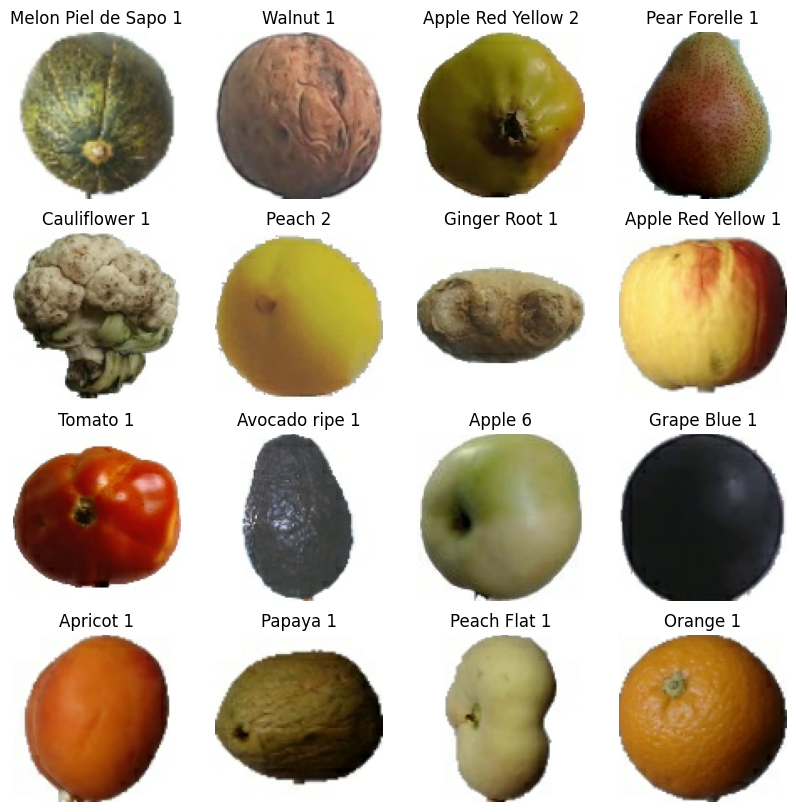

In [ ]:
#print a some examples to show the dataset
class_names = training_dataset.class_names
print(class_names)
print(len(class_names))
# plot some example data from the database
plt.figure(figsize=(10, 10))
for images, labels in training_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))

    plt.title(class_names[np.argmax(labels[i])])
    plt.axis("off")
plt.show()

## Loss Function
Both models utilize catgorical_crossentropy. Since our labels are one-hot encoded, this function was suitable. The categorical nature of our date, our number of classes and our use of softmax also made this loss function ideal over other loss functions.

# The Optimiser
# AdamW
Both models utilize AdamW, a version of adam that accounts for regularization via weight decay. This helps to prenalize large weights, prevent overfitting and improve generalization. Our weight decay was initially 1e-5, but we changed it to 1e-6 after discovering it provided increased performance by reducing oscillation.


In [ ]:
#defines the resnet model, no imagenet weights are used, include top is set to false to replace the top with a layer with 141 outputs
modelResNet = tf.keras.applications.ResNet152(weights = None, include_top = False, input_shape=(INP_SHAPE))
print("total layers: "+str(len(modelResNet.layers)))
x = modelResNet.output # Get the output of the ResNet152 model
#additional layers for connect the output to existing network
x = tf.keras.layers.Dense(1024)(x)
x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1024)(x)
x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(N_CLASSES, activation='softmax')(x)# Dense layer with 141 units and softmax activation for classification

#just in case trainable is set to false (should be true by default)
modelResNet.trainable = True

modelResNet = tf.keras.Model(inputs=modelResNet.input, outputs=x)
modelResNet.summary()

#compile the model with the adamw optimizer, with a weight decay of 1e-6. Loss is set to categorical crossentropy and the desired metrics we want are outlined
modelResNet.compile(
    optimizer=tf.keras.optimizers.AdamW(weight_decay=1e-6),
    loss='categorical_crossentropy',
    metrics=['accuracy', 'Precision',tf.keras.metrics.F1Score(
    average='weighted')]
)

total layers: 515


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 100, 100, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 106, 106, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 50, 50, 64)     │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 50, 50, 64)     │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 50, 50, 64)     │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 52, 52, 64)     │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 25, 25, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 25, 25, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 25, 25, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 25, 25, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 25, 25, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 25, 25, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 25, 25, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 25, 25, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 25, 25, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 61,663,245 (235.23 MB)

 Trainable params: 61,511,821 (234.65 MB)

 Non-trainable params: 151,424 (591.50 KB)

In [ ]:
#optimizes the datasets and pipeline for faster training
trainResNet = trainResNet.prefetch(buffer_size=tf.data.AUTOTUNE)
validationResNet = validationResNet.prefetch(buffer_size=tf.data.AUTOTUNE)
testResNet = testResNet.prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
#training
history = modelResNet.fit(trainResNet, epochs=EPOCHS,  validation_data = validationResNet)

Epoch 1/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 192s 199ms/step - Precision: 0.0809 - accuracy: 0.0140 - f1_score: 0.0094 - loss: 6.1095 - val_Precision: 0.0000e+00 - val_accuracy: 0.0063 - val_f1_score: 7.7640e-05 - val_loss: 5.1544
Epoch 2/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - Precision: 0.0381 - accuracy: 0.0395 - f1_score: 0.0219 - loss: 4.3166 - val_Precision: 0.0000e+00 - val_accuracy: 0.0250 - val_f1_score: 0.0015 - val_loss: 7.0049
Epoch 3/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - Precision: 0.1082 - accuracy: 0.0746 - f1_score: 0.0545 - loss: 3.8225 - val_Precision: 0.0000e+00 - val_accuracy: 0.0083 - val_f1_score: 2.5563e-04 - val_loss: 6.8507
Epoch 4/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - Precision: 0.2176 - accuracy: 0.1249 - f1_score: 0.1049 - loss: 3.3260 - val_Precision: 0.0964 - val_accuracy: 0.0490 - val_f1_score: 0.0196 - val_loss: 11.9396
Epoch 5/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 118ms/step - Precision: 0.3773 - accuracy: 0.2234 - f1_score: 0.20

# Cross Fold Validation

We decided to use K-Fold Cross Fold Validation for both models, for consistency. The KFold has seven folds, determined by the FOLDS constant. This seemed like a solid middle ground and provided reasonable results

In [ ]:

#change dataset to a format that skiklet learns kfold object can use
def dataset_to_numpy(dataset):
  images = []
  labels = []
  for image_batch, label_batch in dataset:
    images.append(image_batch.numpy())
    labels.append(label_batch.numpy())
  return np.concatenate(images), np.concatenate(labels)

#perform a cross validation test
def cross_validation(model, data):
  scores_dict = {
    "accuracy": [],
    "precision": [],
    "f1_score": [],
    "loss": []
  }

  X_test, y_test = dataset_to_numpy(data)

  kfold = KFold(n_splits=FOLDS, shuffle=True)

  i = 0
  for train_index, val_index in kfold.split(X_test):
    print("loop: "+ str(i))
    i += 1

    # Get the data for the current fold
    X_train_fold, X_val_fold = X_test[train_index], X_test[val_index]
    y_train_fold, y_val_fold = y_test[train_index], y_test[val_index]

    #perform the test
    test_loss, test_acc, test_precision, test_f1 = model.evaluate(
      X_val_fold, y_val_fold, verbose=4
    )

    scores_dict['accuracy'].append(test_acc)
    scores_dict['loss'].append(test_loss)
    scores_dict['precision'].append(test_precision)
    scores_dict['f1_score'].append(test_f1)
  return scores_dict

# Resuls - Part 1 (ResNet)
The ResNet152 model ran for 605 seconds, and in 30 epochs the metrics improved drastically. Accuracy started at 0.014 and finished at 0.93.
The memory metrics for ResNet152 are as follows

resnet:

Total params: 61,663,245 (235.23 MB)

 Trainable params: 61,511,821 (234.65 MB)

 Non-trainable params: 151,424 (591.50 KB)

  
The following few cells all contain the result metrics and graphs of the ResNet model.

 Here we can see the accuracy, loss, precision and f1_score for each fold in the K-fold Cross Validation.

 Accuracy measures the proportion of correct predictions made by the model, out of the total number of predictions. This gives a good indication of how the model is performing overall. For each KFold the model's accuracy stayed in the 0.876 to 0.89

 Loss is a measure of the error between the predicted labels and actual labels. It gives a good indication of how the model is improving or not improving, it should be inversely proportional to the accuracy. As accuracy approaches one, loss should proportiantely approach 0. Here, loss stays between 0.54 and 0.39, with one outlier of 0.73.

 Precision measures how many predicted positive labels are actually correct. Precision stays between 0.89 and 0.9

 F1-score is a value concerning the harmonic mean of the precision and the recall. It gives a more balanced view of the model, without just focusing on precision or recall. For 0.86 to 0.87

In [ ]:
#run cross validation and print results
scores_dict = cross_validation(modelResNet, testResNet)
print(scores_dict['accuracy'])
print(scores_dict['loss'])
print(scores_dict['precision'])
print(scores_dict['f1_score'])


loop: 0
loop: 1
loop: 2
loop: 3
loop: 4
loop: 5
loop: 6
[0.8822916746139526, 0.8895833492279053, 0.8968750238418579, 0.8770833611488342, 0.8760416507720947, 0.890625, 0.8864583373069763]
[0.5301602482795715, 0.43400028347969055, 0.3988238573074341, 0.5003598928451538, 0.43911582231521606, 0.5414263010025024, 0.7302548289299011]
[0.8926673531532288, 0.8987206816673279, 0.9055201411247253, 0.8912580013275146, 0.8916308879852295, 0.9001062512397766, 0.8946808576583862]
[0.8772386312484741, 0.8793818354606628, 0.8925027847290039, 0.8664573431015015, 0.867119550704956, 0.8795024156570435, 0.8779903650283813]


In [ ]:
def subplotArr(axes, x_values, scores, score_shown):
    axes.plot(x_values, scores, marker='o')
    axes.set_title(score_shown)
    axes.set_xlabel('Fold')
    axes.set_ylabel('Score')

def plot_cross_validation_scores(accuracy_scores, precision_scores, f1_scores, loss_scores):
    x_values = np.arange(len(accuracy_scores))

    # plot containing subplots
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle('Cross-Validation Scores', fontsize=16)

    # acc
    subplotArr(axes[0, 0], x_values, accuracy_scores, 'Accuracy')
    # precision
    subplotArr(axes[0, 1], x_values, precision_scores, 'Precision')
    # f1
    subplotArr(axes[1, 0], x_values, f1_scores, 'F1-Score')
    # loss
    subplotArr(axes[1, 1], x_values, loss_scores, 'Loss')

    plt.tight_layout()
    plt.show()



# Graphs
These graphs show the general trend for each metric over each fold. Aside from one outlier in the loss graph, they are all fairly consistent and oscillate within a small range.

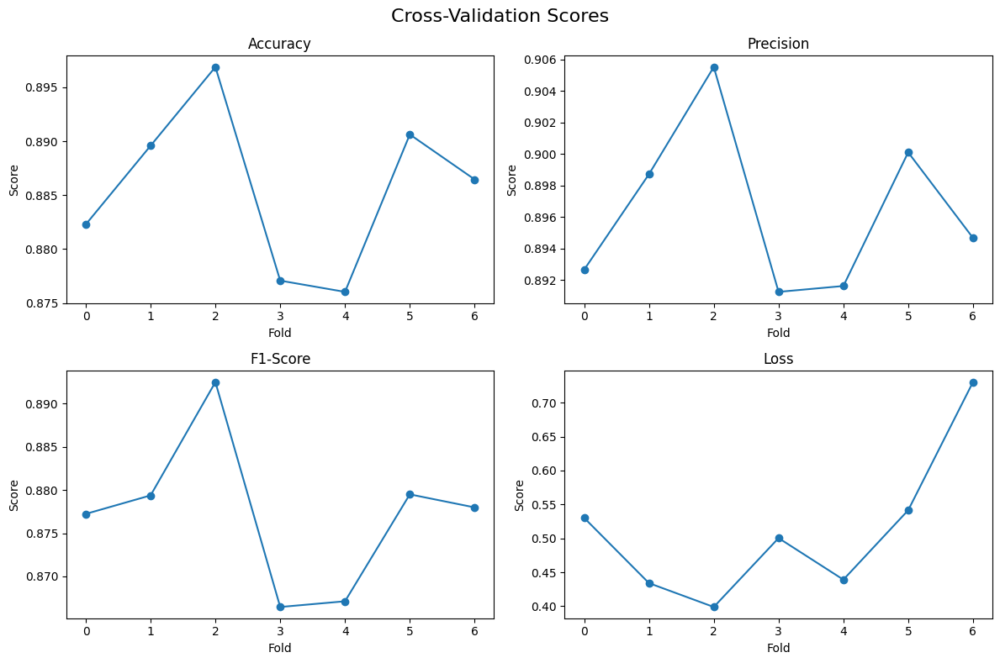

In [ ]:
plot_cross_validation_scores(scores_dict['accuracy'],scores_dict['precision'],scores_dict['f1_score'],
    scores_dict['loss'])

In [ ]:
def get_crossfold_avgs(scores_dict):
  avg_scores = {}
  for key in scores_dict:
    avg_scores[key] = sum(scores_dict[key]) / len(scores_dict[key]) if len(scores_dict[key]) > 0 else 0
  return avg_scores['accuracy'], avg_scores['precision'], avg_scores['f1_score'], avg_scores['loss']

In [ ]:

#print trian vs test stats
def text_stats(model,test_data_set):
  cf_accuracy_score, cf_precision_score, cf_f1_score, cf_loss_score = get_crossfold_avgs(scores_dict)

  small_test = test_data_set.take(30)
  test_loss, test_acc, test_precision, test_f1 = model.evaluate(small_test, verbose=4)
  #history.history.append(test_loss, test_acc, test_precision)
  history.history["test_loss"] = test_loss
  history.history["test_accuracy"] = test_acc
  history.history["test_Precision"] = test_precision
  history.history["test_f1_score"] = test_precision

  print('Crossfold test averages:')
  print('\nCrossfold accuracy:', cf_accuracy_score)
  print('\nCrossfold precision:', cf_precision_score)
  print('\nCrossfold loss:', cf_loss_score)
  print('\nCrossfold cf_f1_score:', test_precision)

  print('Test:')
  print('\nTest accuracy:', test_acc)
  print('\nTest precision:', test_precision)
  print('\nTest loss:', test_loss)
  print('\nTest f1:', test_f1)

  print('\nTrain:')
  print('\nTrain accuracy:', history.history['accuracy'][EPOCHS-1])
  #if on TPU 'precision' if on CPU 'Precision' idk why
  print('\nTrain precision:', history.history['Precision'][EPOCHS-1])
  print('\nTrain loss:', history.history['loss'][EPOCHS-1])
  print('\nTrain f1:', history.history['f1_score'][EPOCHS-1])


  print('\nOverfit:')
  #print the gap between trian and test
  print('\naccuracy overfit:', history.history['accuracy'][EPOCHS-1] - test_acc)
  print('\nprecision overfit:', history.history['Precision'][EPOCHS-1] - test_precision)
  print('\nf1 overfit:', history.history['f1_score'][EPOCHS-1] - test_f1)


In [ ]:

text_stats(modelResNet,testResNet)

Crossfold test averages:

Crossfold accuracy: 0.8855654852730888

Crossfold precision: 0.8963691677365985

Crossfold loss: 0.5105916048799243

Crossfold cf_f1_score: 0.8981972336769104
Test:

Test accuracy: 0.8895833492279053

Test precision: 0.8981972336769104

Test loss: 0.5169603824615479

Test f1: 0.8823454976081848

Train:

Train accuracy: 0.9392361044883728

Train precision: 0.9471166133880615

Train loss: 0.20359830558300018

Train f1: 0.9390203952789307

Overfit:

accuracy overfit: 0.04965275526046753

precision overfit: 0.04891937971115112

f1 overfit: 0.05667489767074585


In [ ]:
#plot losses
def plot_stats(history,stat):
  plt.plot(epochs_r, history.history[stat], 'r', label='Training '+stat)
  plt.plot(epochs_r, history.history['val_'+stat], 'b', label='Validation '+stat)
  plt.plot(EPOCHS, history.history['test_'+stat], 'p', label='Test '+stat)
  plt.title('Training, validation and test '+stat)
  plt.xlabel('Epochs')
  plt.ylabel(stat)
  plt.legend()
  plt.show()

# Training, Testing and Validation graphs
Below is the graphs for the training, testing and validation metrics outside of the k-fold validation.
Other than two outliers in the validation loss, the results are consistent with what was expected.
The accuracy, precision, and F1-score graphs are quite similar. This is most likely due to the data being well balanced and the models' good performance. The models seem to have achieved a good trade-off between precision and recall, and rather consistent results across different classes.

dict_keys(['Precision', 'accuracy', 'f1_score', 'loss', 'val_Precision', 'val_accuracy', 'val_f1_score', 'val_loss', 'test_loss', 'test_accuracy', 'test_Precision', 'test_f1_score'])


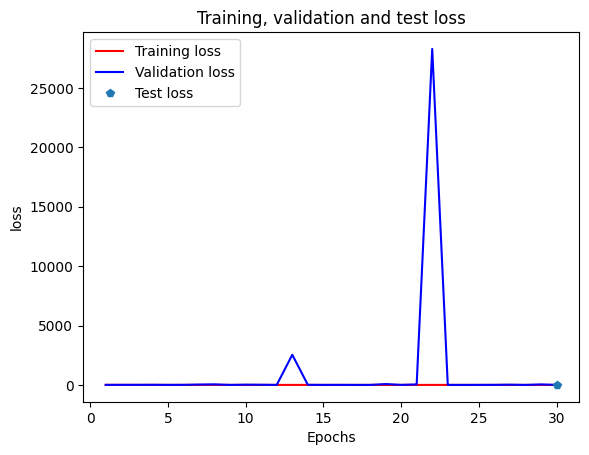

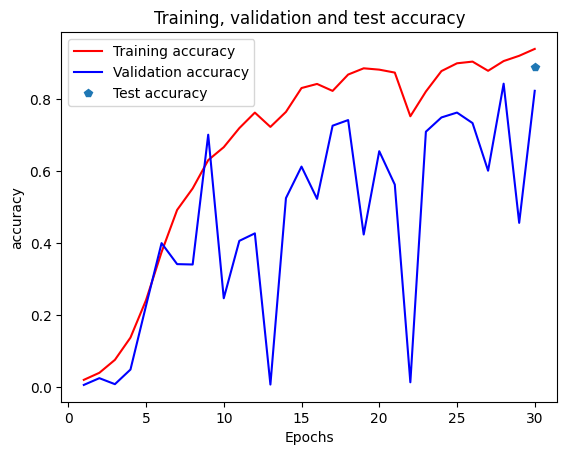

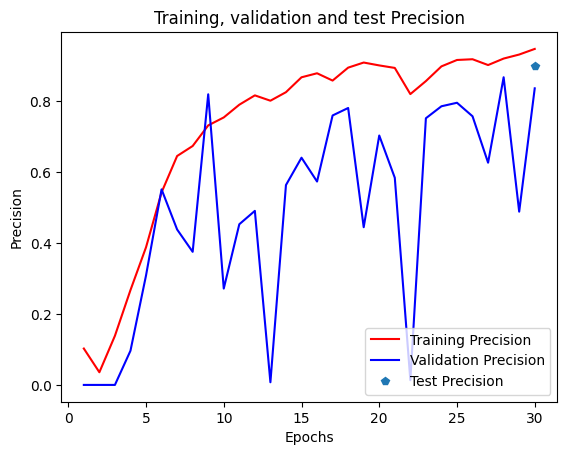

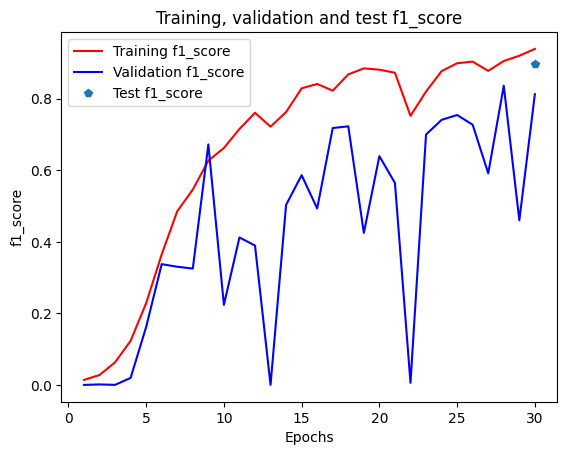

In [ ]:

print(history.history.keys())
plot_stats(history, 'loss')
plot_stats(history, 'accuracy')
plot_stats(history,'Precision')
plot_stats(history,'f1_score')

In [ ]:
#based on https://machinelearningmastery.com/how-to-visualize-filters-and-feature-maps-in-convolutional-neural-networks/
#show the feature maps produces by convolutional layers
# get the outputs of convolutional layers in the model
def get_feature_maps(model, test_set):
  layer_outputs = [layer.output for layer in model.layers if 'conv' in layer.name.lower()]
  print(len(layer_outputs))
  if len(layer_outputs) > 80:
    layer_outputs = layer_outputs[:80]

  print(len(layer_outputs))

  image_to_fm = None
  #pick an image to show feature maps of
  for images, labels in test_set.take(1):
    #cast to match the input shape of the cnn bc it expects to be reciving a batch
    image_to_fm = images[0].numpy().reshape(1, IMG_SZ, IMG_SZ, 3)

  for out_layer in layer_outputs:
    feature_map_model = models.Model(inputs=model.inputs, outputs=out_layer)
    feature_maps = feature_map_model.predict(image_to_fm)
    num_feature_maps = feature_maps.shape[-1]

    num_to_display = min(num_feature_maps, 16)
    # plot 16 of the feature maps for each convlutional layer
    square = 4
    fm_i = 1
    for _ in range(square):
      for _ in range(square):
        if fm_i > num_to_display:
          break
        #put the image on the graph as a sublot
        plt.subplot(square, square, fm_i)
        plt.imshow(feature_maps[0, :, :, fm_i-1])
        fm_i += 1
        plt.axis("off")
      # show the figurevnum_feature_mapsnum_feature_mapsnum_feature_maps
    plt.show()


#Feature Maps

We calculated and displayed the feature maps of the model as shown below. It shows how the model processes each image, for different depths in the CNN. There are less data points here, since the Resnet152 has 512 of layers, we decided not to them all, but ideally by the end each image will only contain a 4x4 image of pixels, as shown by the EfficientNetB0 map later on.

512
80
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


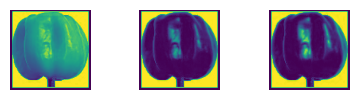

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


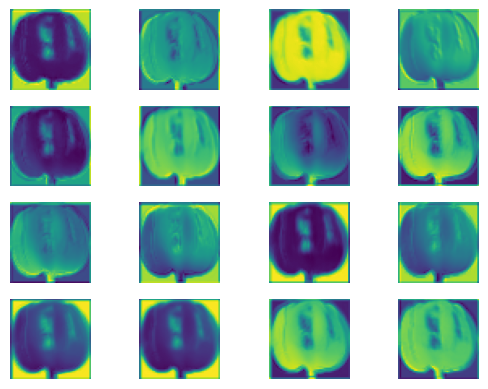

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step


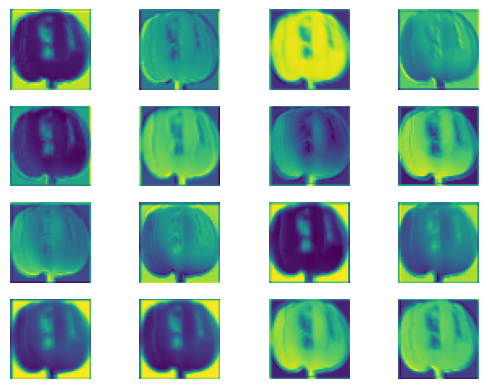

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


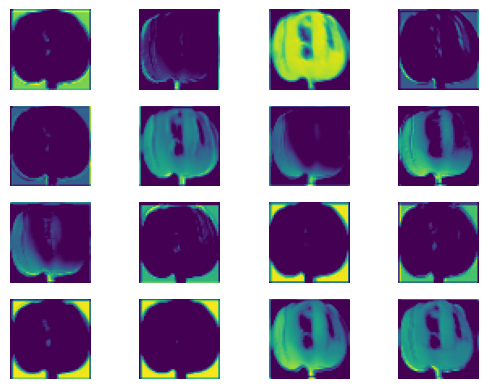

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step


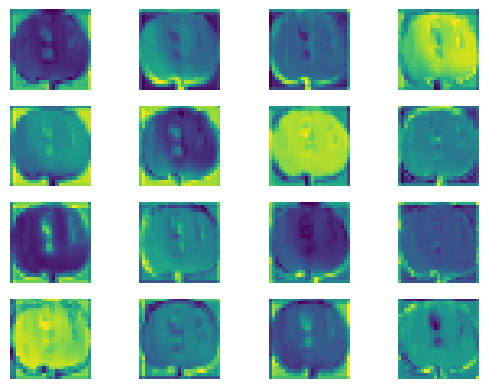

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step


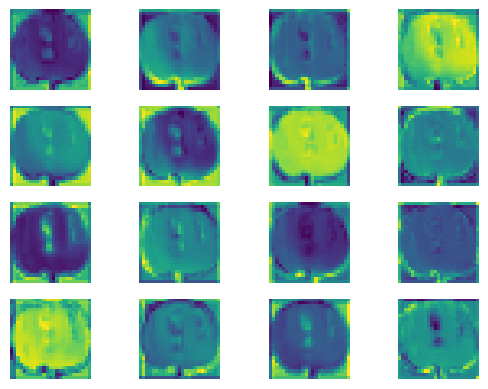

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step


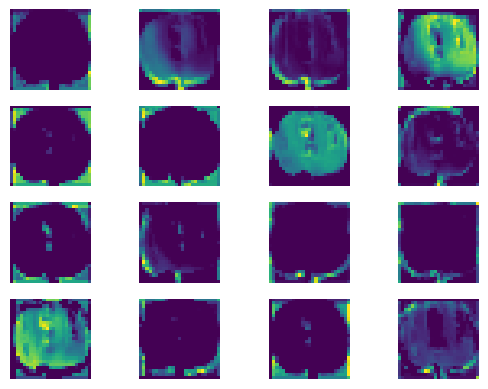

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step


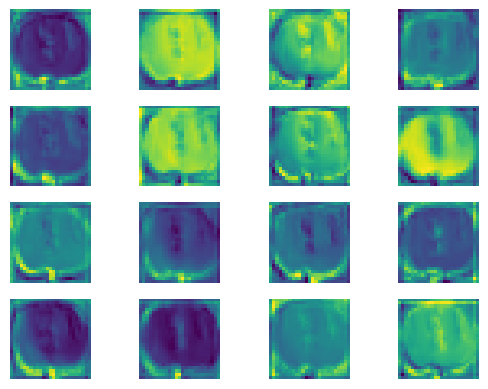

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


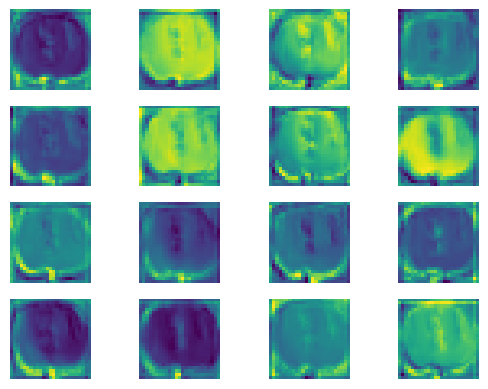

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


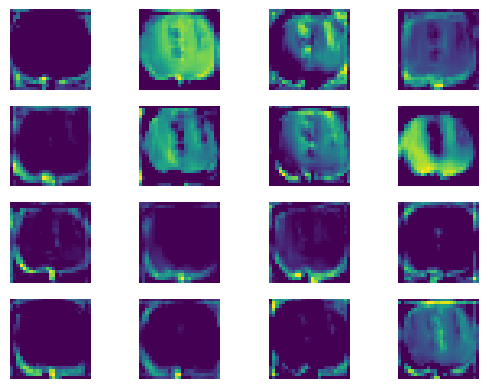

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


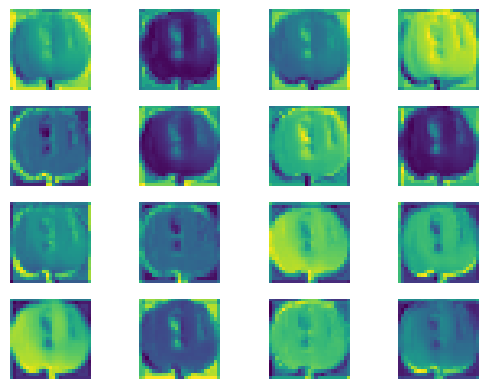

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


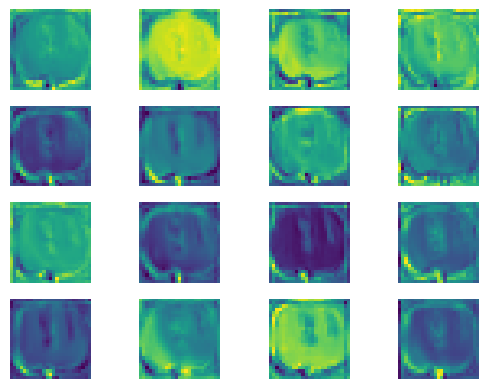

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


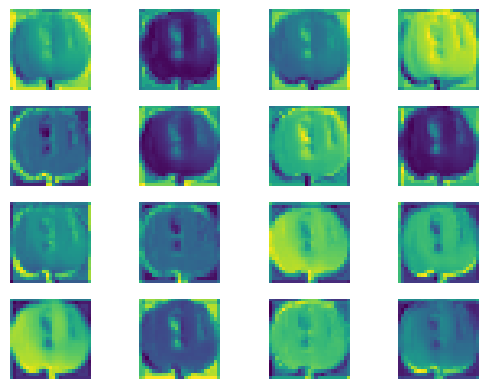

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


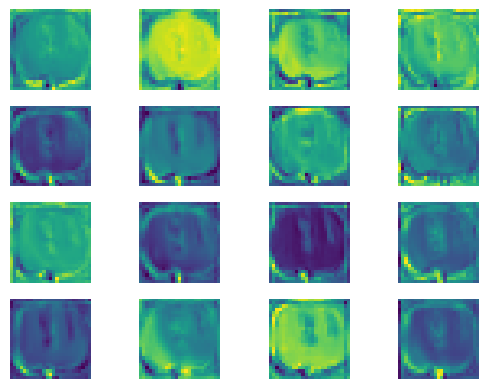

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step


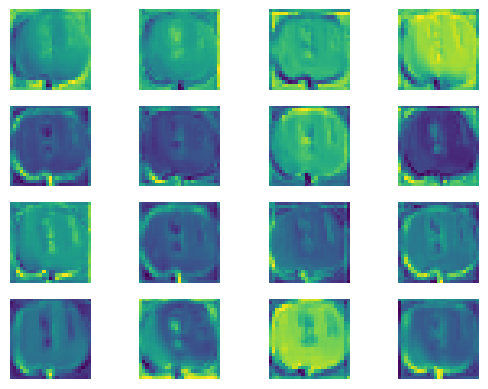

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step


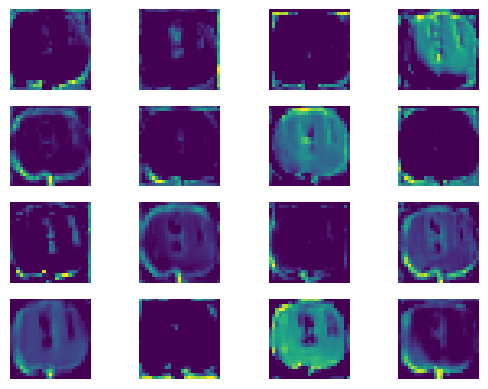

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


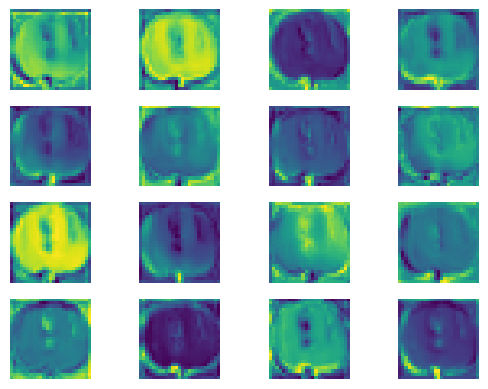

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


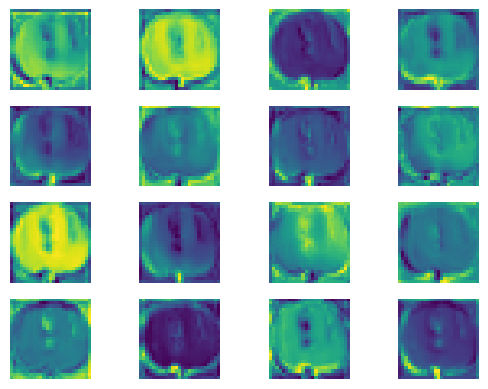

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


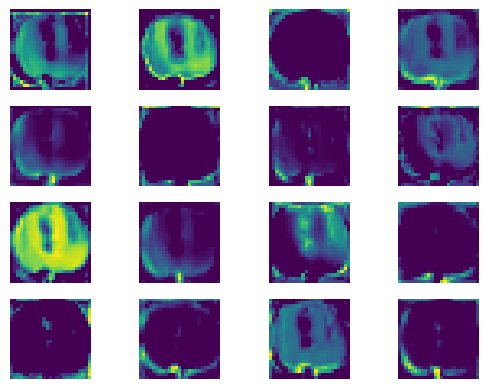

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


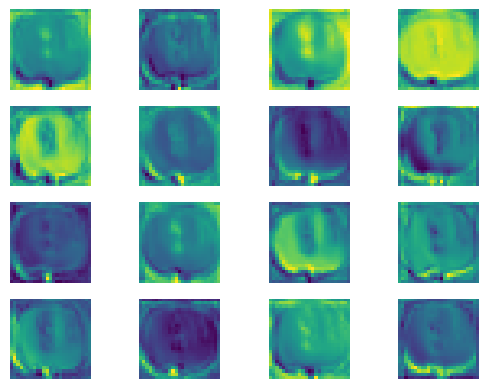

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


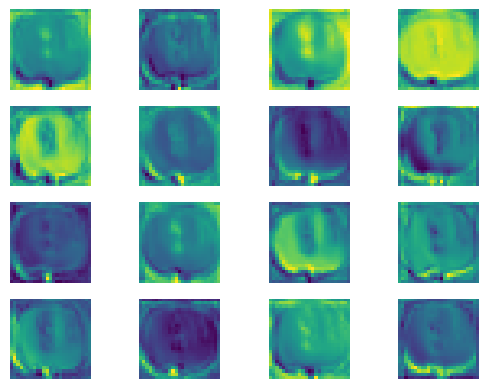

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


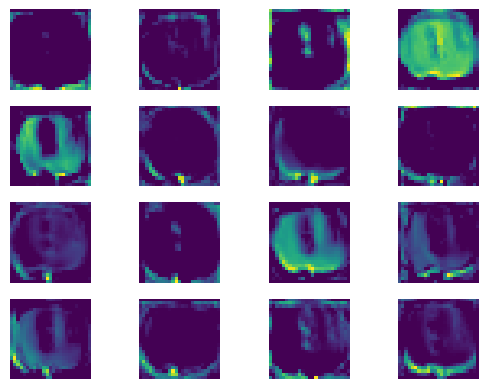

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step


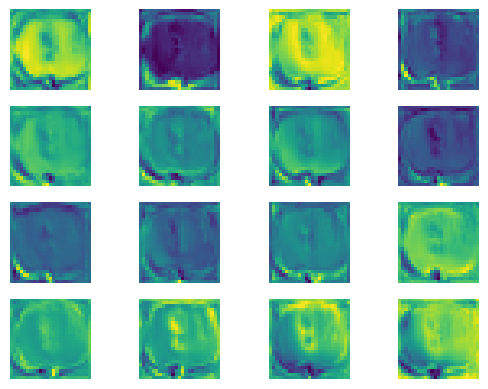

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step


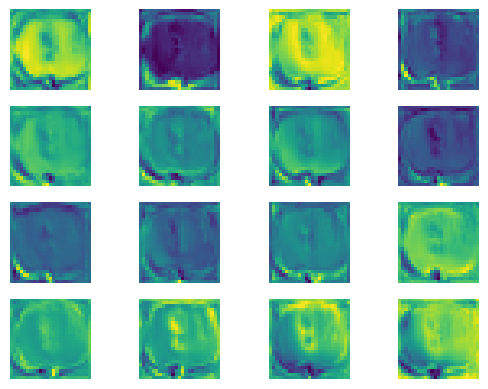

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


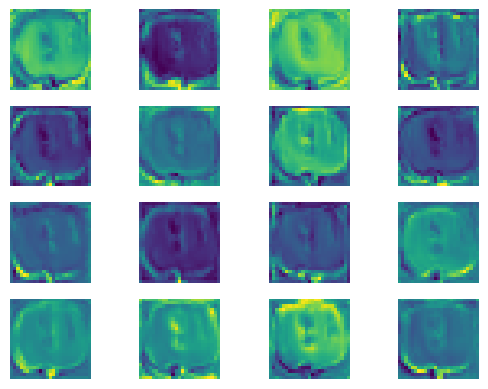

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


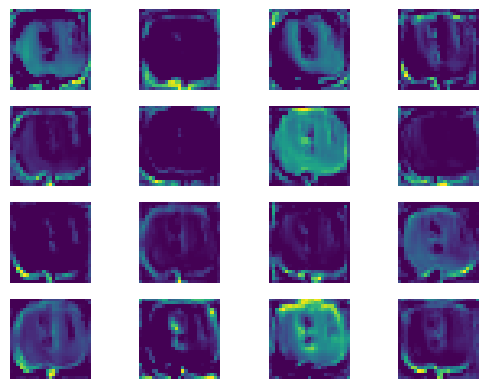

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


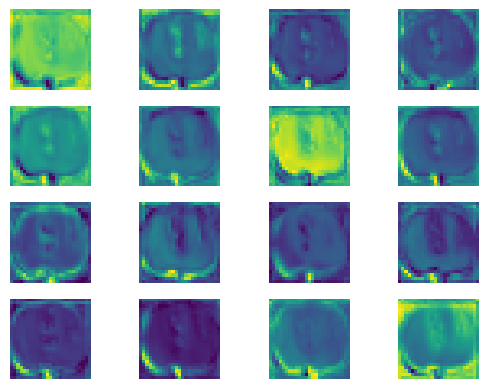

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step


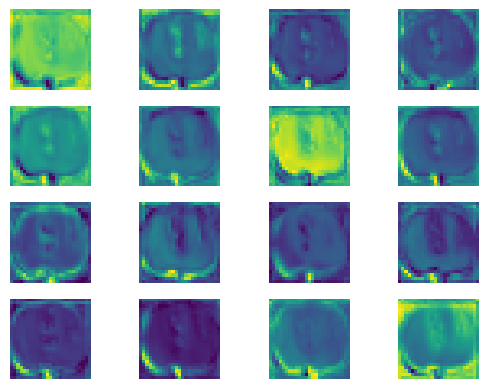

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


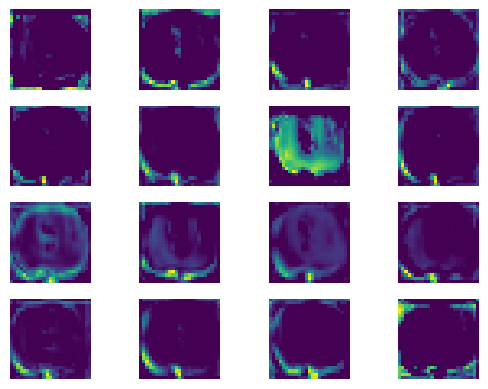

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step


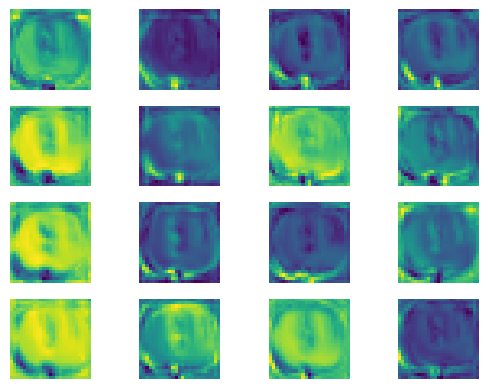

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step


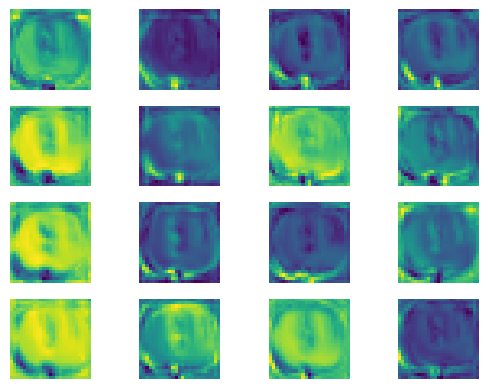

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step


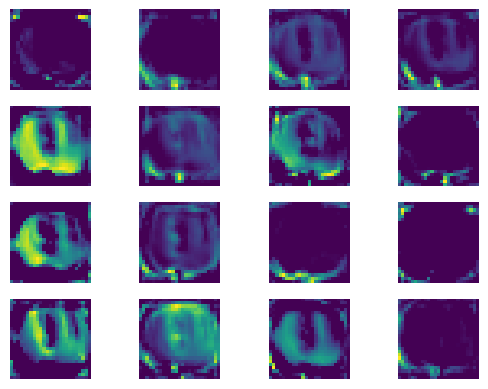

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 707ms/step


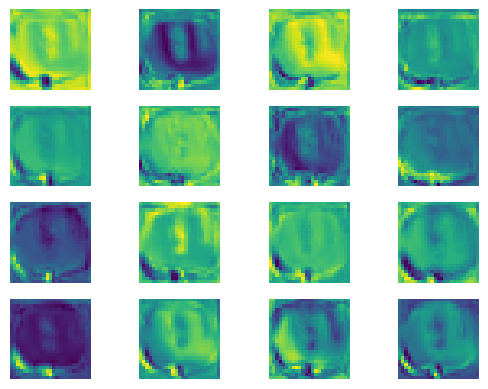

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step


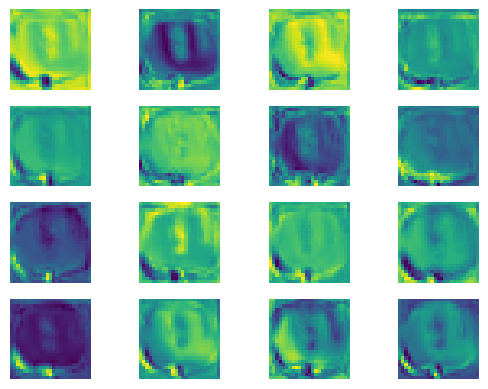

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step


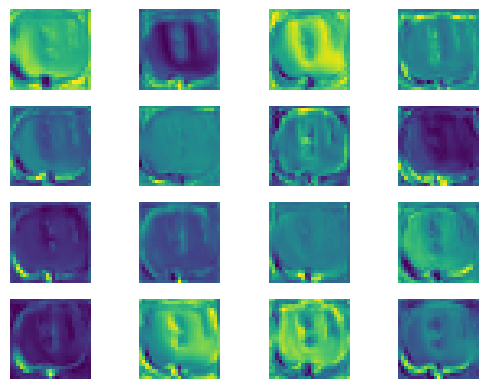

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 728ms/step


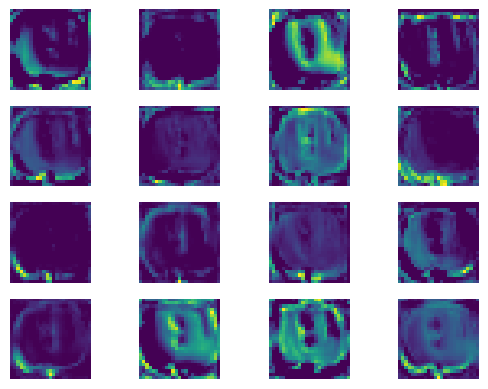

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


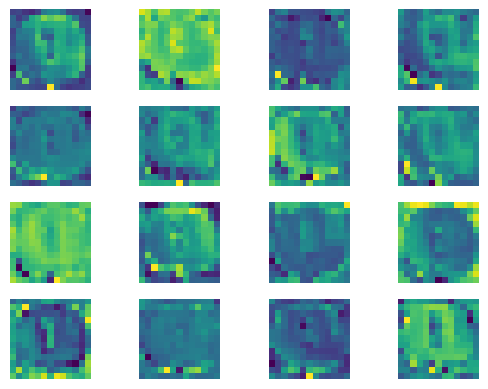

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


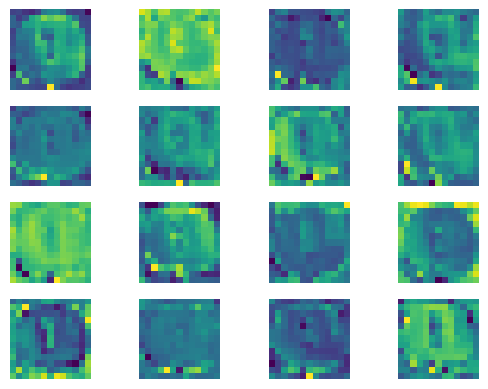

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 806ms/step


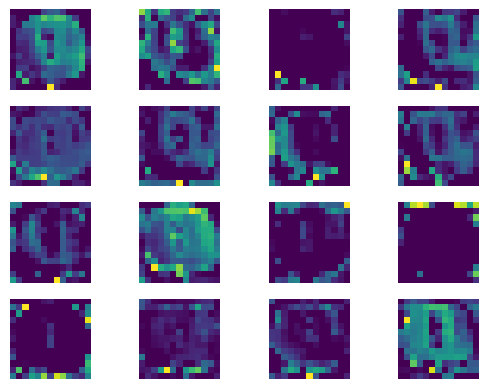

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 859ms/step


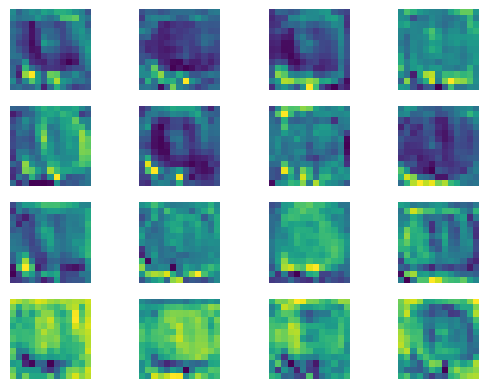

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 860ms/step


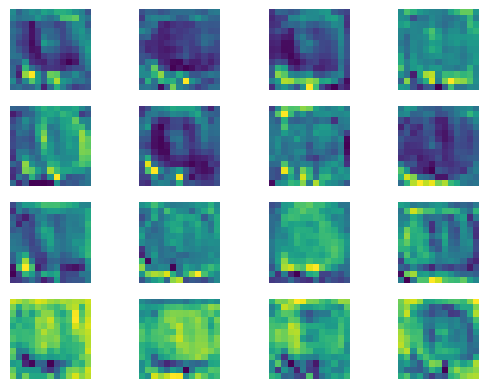

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 853ms/step


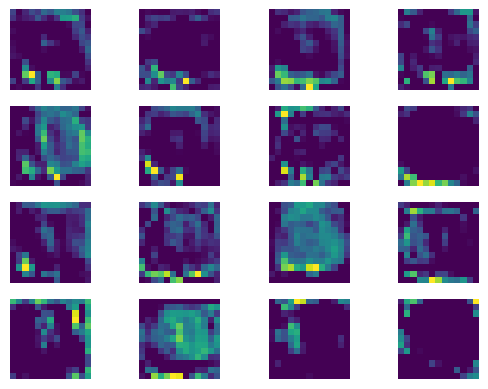

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step


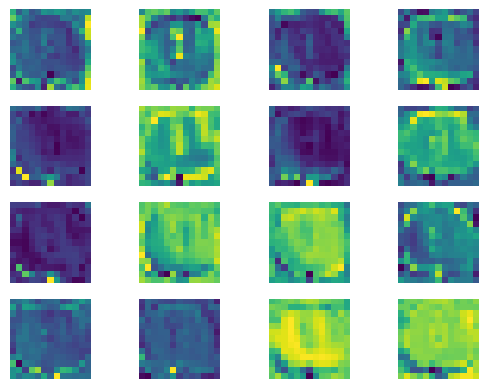

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step


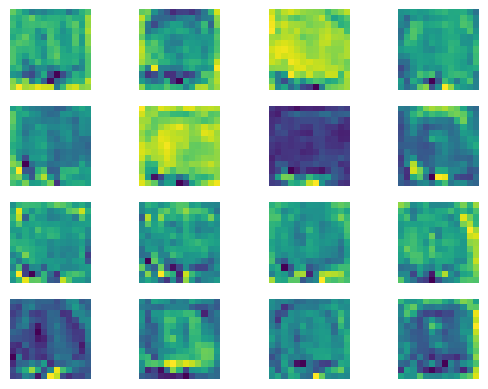

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step


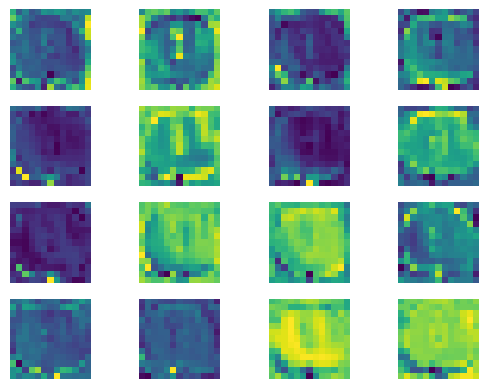

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 895ms/step


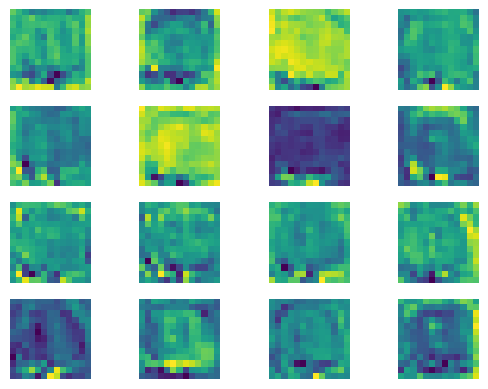

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 934ms/step


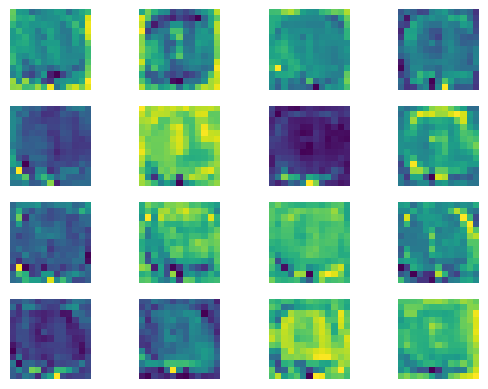

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step


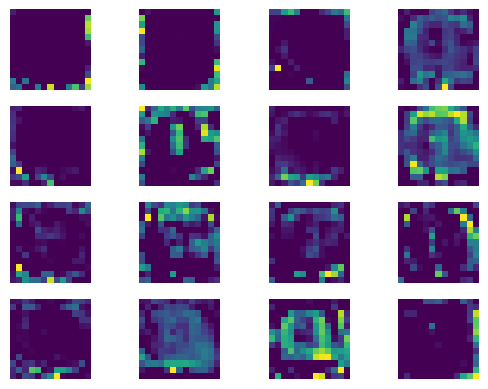

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step


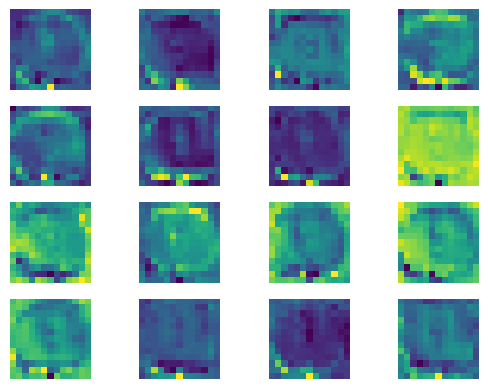

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


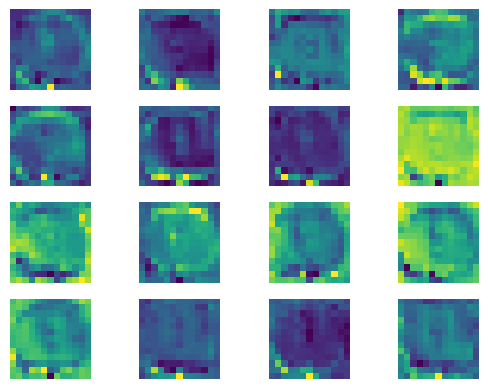

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


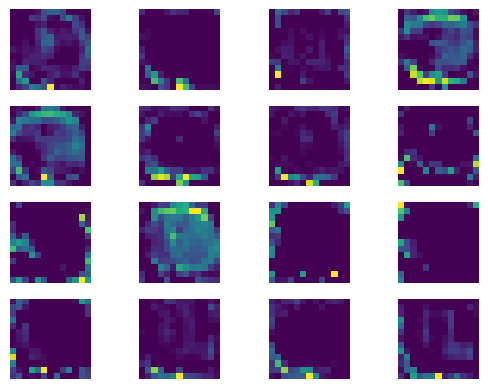

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


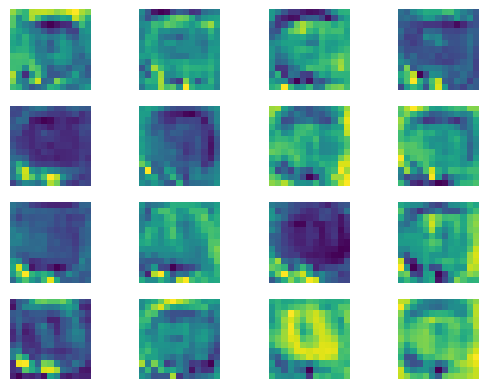

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step


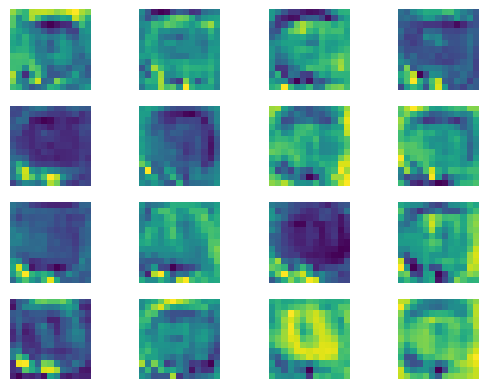

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step


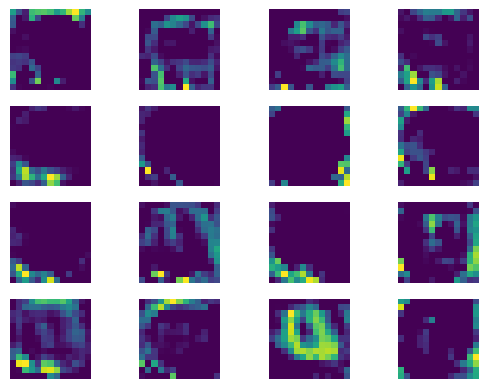

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


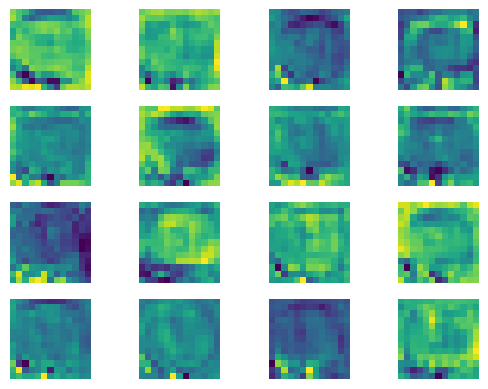

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


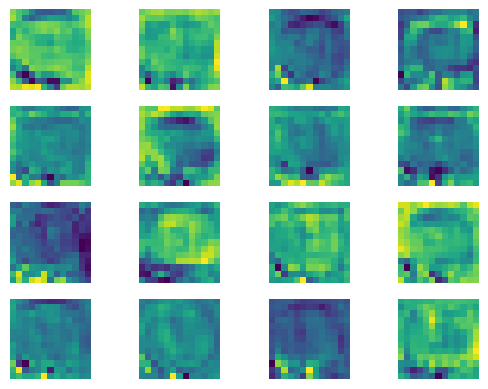

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


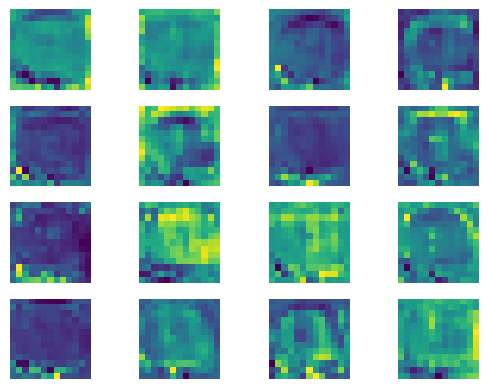

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


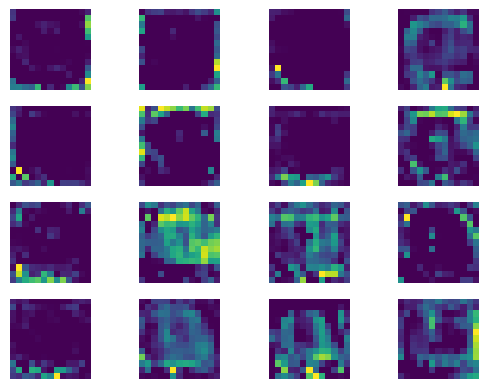

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


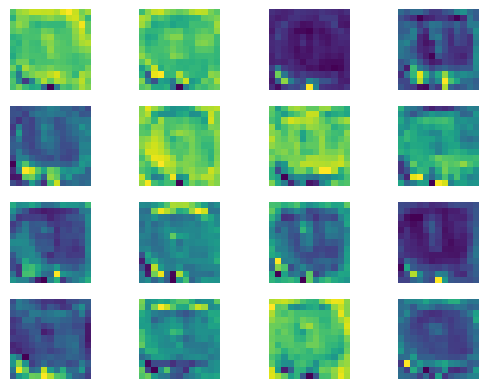

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


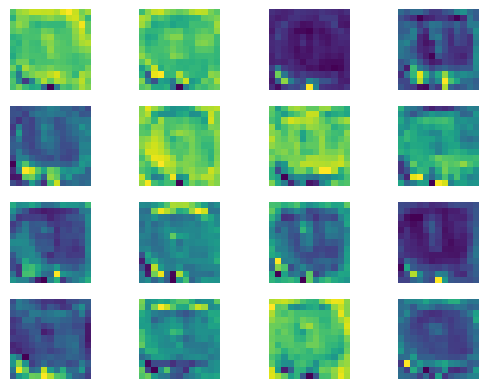

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


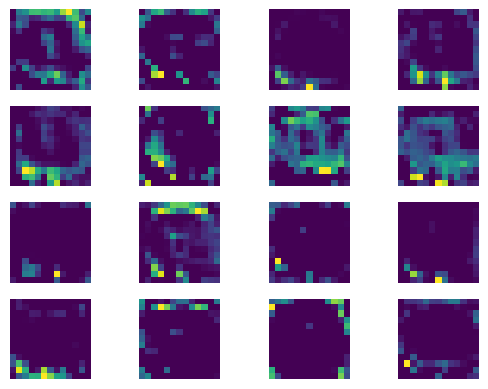

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


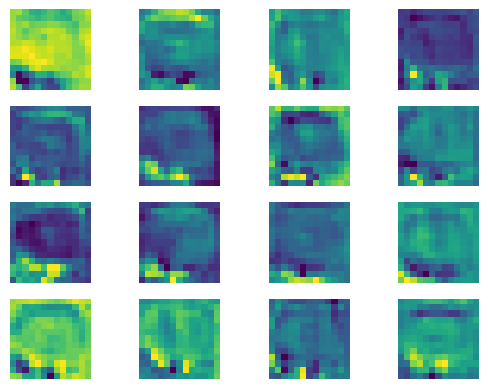

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


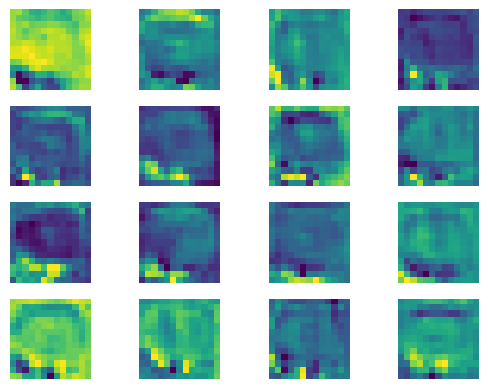

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


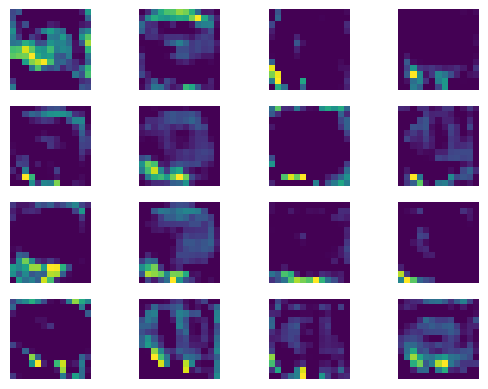

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


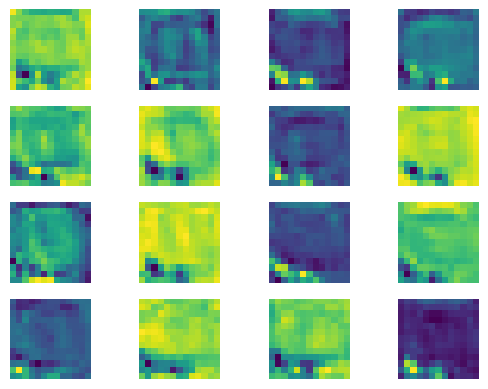

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


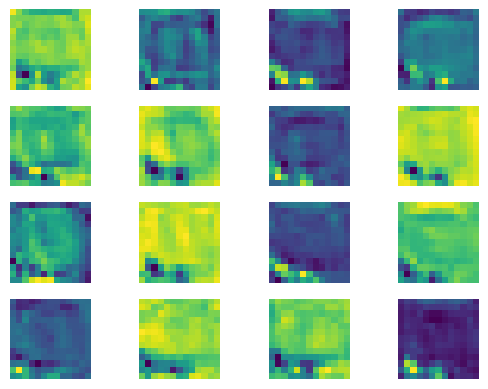

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


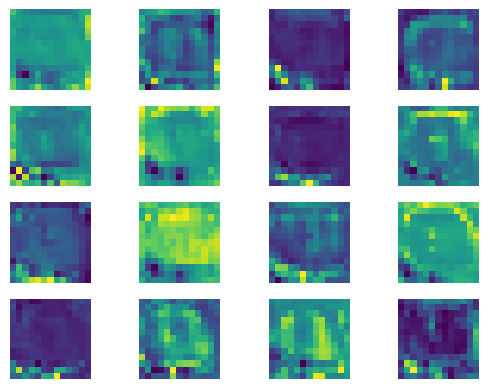

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


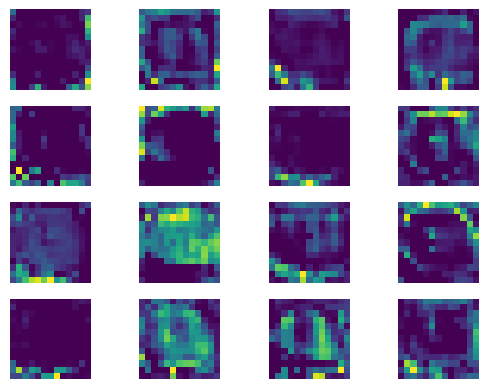

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


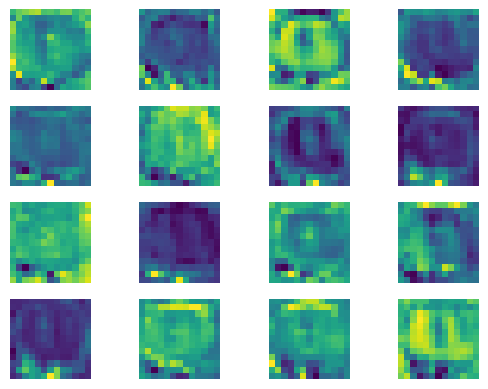

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


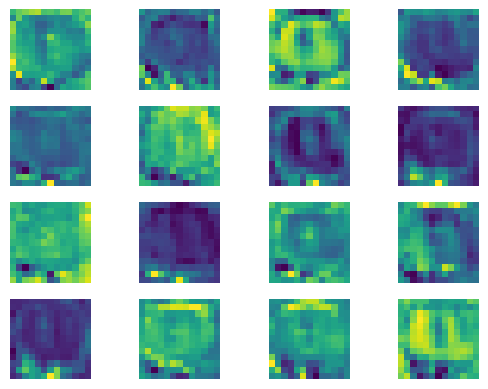

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


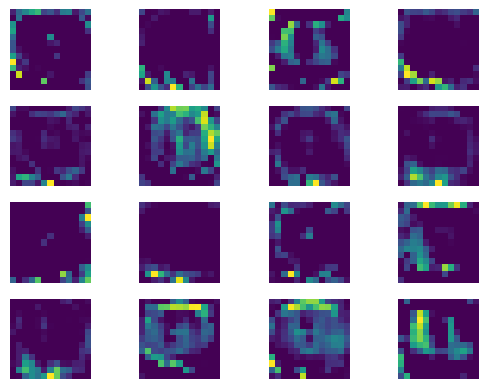

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


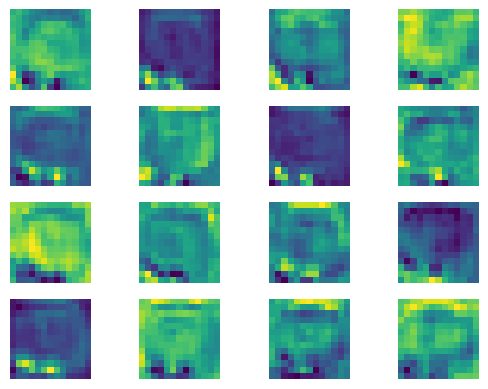

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


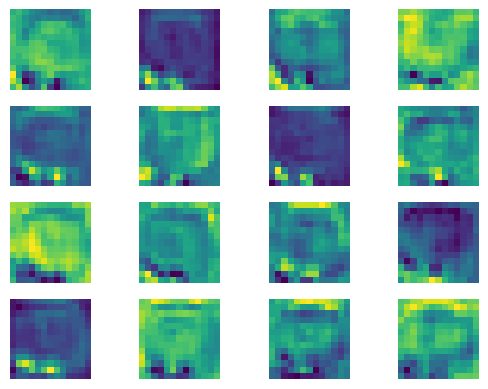

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


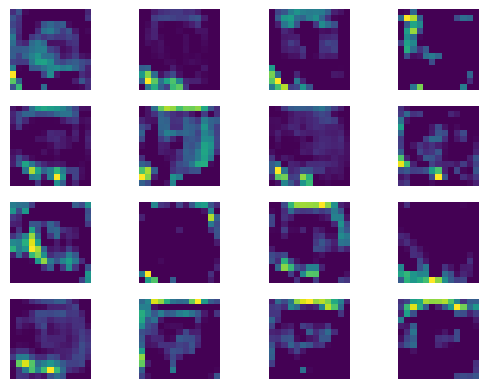

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


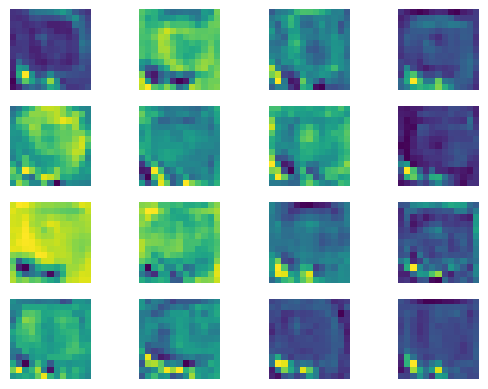

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


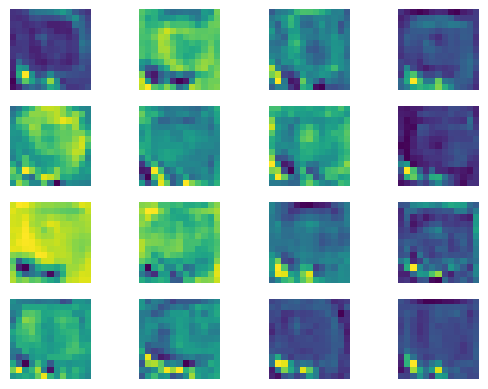

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


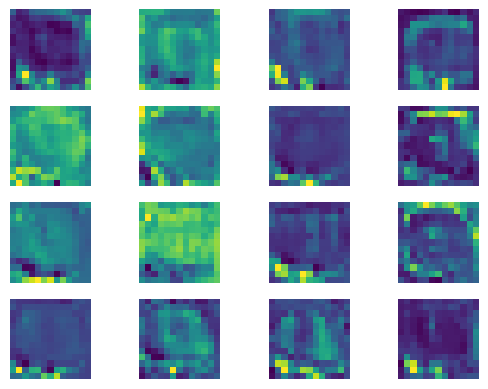

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


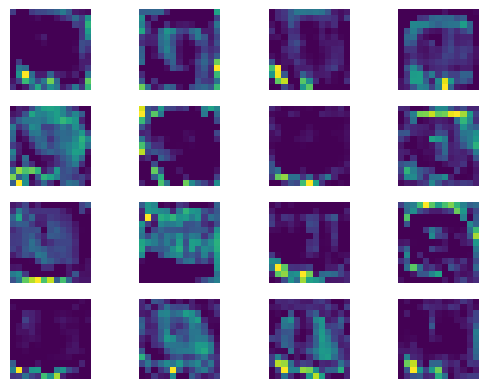

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


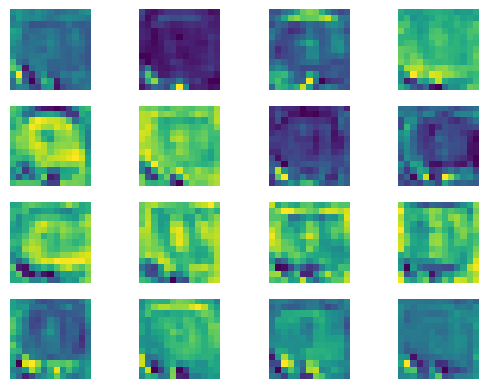

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


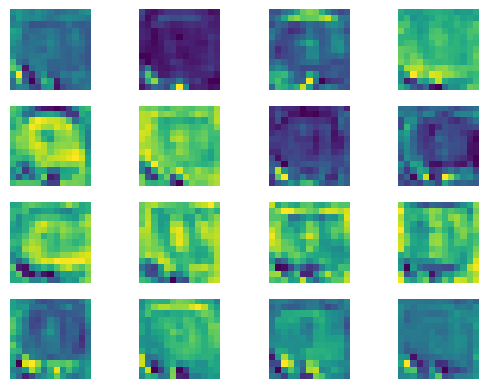

In [ ]:
get_feature_maps(modelResNet,testResNet)

In [ ]:
#same visualizeation as before training above but with predicted labels shown
#rather than the true labes in the dataset
def visualize_predictions(model,test_set):
  plt.figure(figsize=(9, 9))
  for images, labels in test_set.take(1):
    for i in range(16):
      #put the image on the graph as a sublot
      plt.subplot(4, 4, i + 1)
      plt.imshow(images[i])

      #cast to match the input shape of the cnn bc it expects to be reciving a batch
      image = images[i].numpy().reshape(1, IMG_SZ, IMG_SZ, 3)

      y_pred = model.predict(image)
      predicted_class_index = np.argmax(y_pred, axis=1)[0]
      predicted_class_name = class_names[predicted_class_index]
      plt.title(predicted_class_name)
      plt.axis("off")

  plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


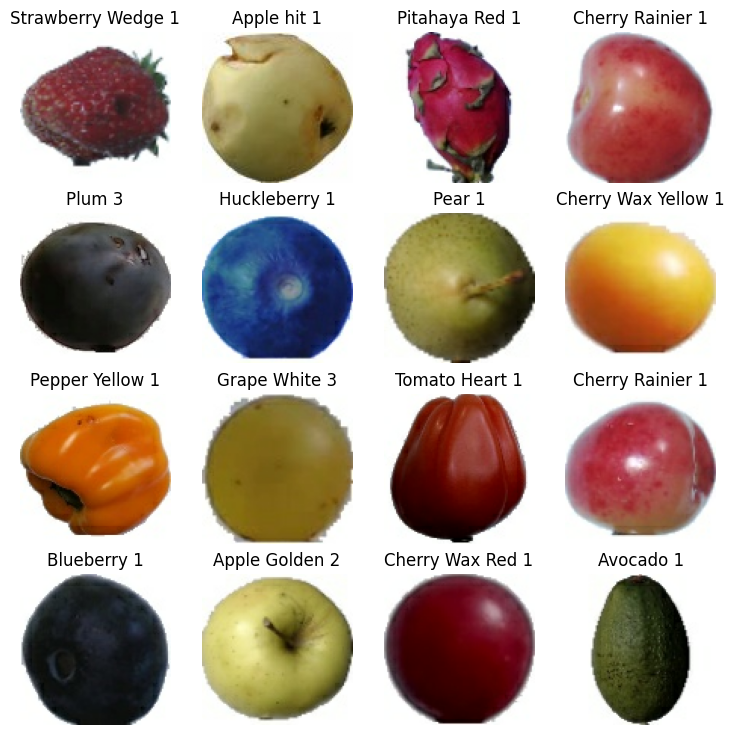

In [ ]:

visualize_predictions(modelResNet,testResNet)

In [ ]:

#make the calculations for the confusion matrix
def calc_conf_matrix(model,test_set):
  y_true_classes = []
  y_pred_classes = []
  for images, labels in test_set:
      y_pred = model.predict(images)#make the prediction
      #y pred is 3 floats representing how likley the model thinks it is to be each class
      predicted_class_indices = np.argmax(y_pred, axis=1)
      predicted_class_names = [class_names[name_i] for name_i in predicted_class_indices]
      y_pred_classes.extend(predicted_class_names)

      true_class_indices = np.argmax(labels, axis=1)
      true_class_names = [class_names[name_i] for name_i in true_class_indices]
      y_true_classes.extend(true_class_names)

  print(y_true_classes)
  print(y_pred_classes)
  print(test_set.cardinality())
  return y_true_classes, y_pred_classes


In [ ]:

y_true_classes, y_pred_classes = calc_conf_matrix(modelResNet,testResNet)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━

In [ ]:
def plot_conf_matrix(y_true_classes, y_pred_classes):
  cm = confusion_matrix(y_true_classes, y_pred_classes)
  plt.figure(figsize=(30, 30))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', cbar=False,
              xticklabels=class_names, yticklabels=class_names)

  plt.title('Confusion Matrix')
  plt.xlabel('Predicted Label')
  plt.ylabel('True Label')
  plt.show()


# Confusion Matrix
This following large graph shows the confusion matrix, breaking down the number of correct and incorrect predictions for each class. Some things can be learned from this graph, such as the fact that the model often confused Apple Crimson Snow for Onion Red. Most mistakes happen in two classes that look very similar to other fruits. ResNet guessed that all Cherry 2 images were actually Cherry Rainier, and guessed that all Grapefruit White were Tomato Yellow, and so on. Despite these issues, ResNet1 correctly predicted the vast majority of fruits correctly .

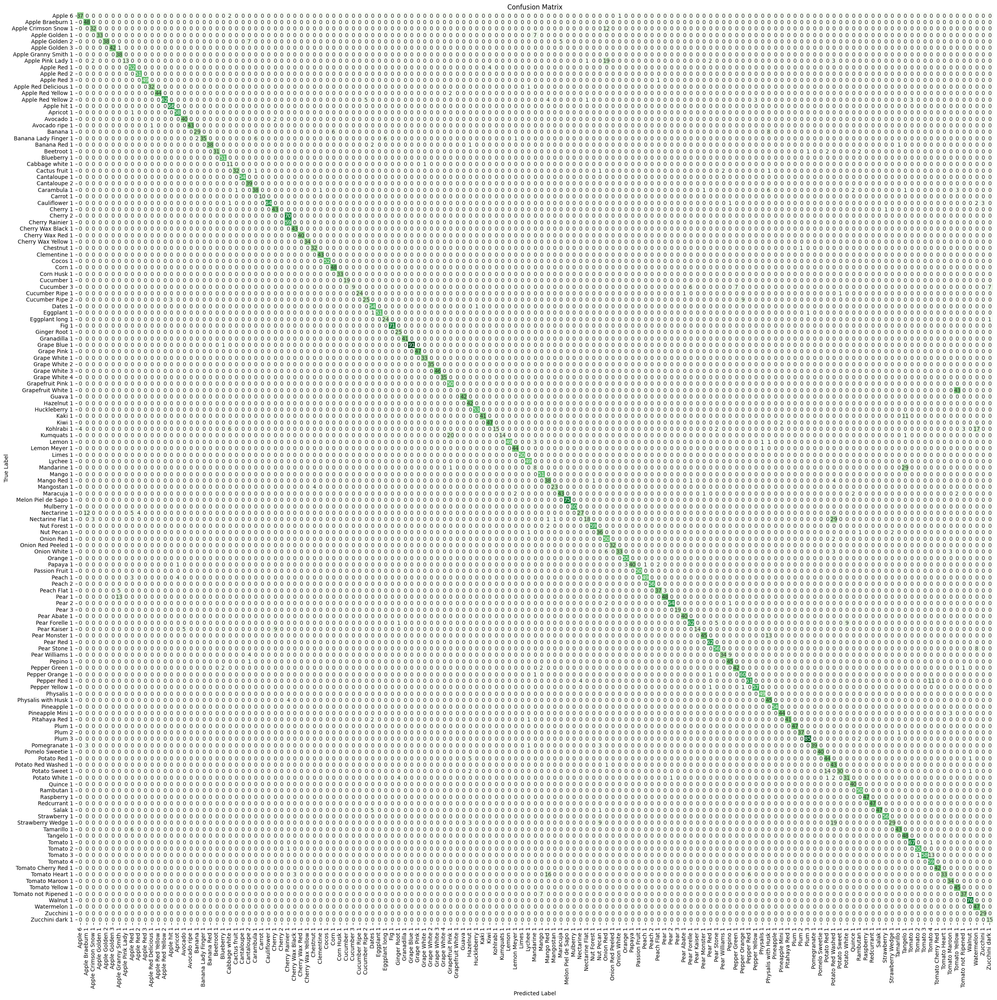

In [ ]:

plot_conf_matrix(y_true_classes, y_pred_classes)

In [ ]:
#shrink datatset so epochs are a more resonable length
train = training_dataset.take(train_card)

val = val_dataset.take(30)

#take the unused data from train
#and use it to create a test set
#skip over the data used for training so there is no overlap
test = training_dataset.skip(train_card).take(test_card)

#normalize the images
train = train.map(normalize_img_pxs)
val = val.map(normalize_img_pxs)
test = test.map(normalize_img_pxs)

print(f"val: {val.cardinality()}")
print(f"test: {test.cardinality()}")
print(f"train: {train.cardinality()}")

val: 30
test: 210
train: 126


In [ ]:
#show class names and print no of each class
class_names = training_dataset.class_names
print(class_names)
print(len(class_names))
class_counts = collections.defaultdict(int)

for images, labels in train:
    true_class_indices = np.argmax(labels, axis=1)
    true_class_names = [class_names[name_i] for name_i in true_class_indices]
    for class_name in true_class_names:
        class_counts[class_name] += 1

print(class_counts)

['Apple 6', 'Apple Braeburn 1', 'Apple Crimson Snow 1', 'Apple Golden 1', 'Apple Golden 2', 'Apple Golden 3', 'Apple Granny Smith 1', 'Apple Pink Lady 1', 'Apple Red 1', 'Apple Red 2', 'Apple Red 3', 'Apple Red Delicious 1', 'Apple Red Yellow 1', 'Apple Red Yellow 2', 'Apple hit 1', 'Apricot 1', 'Avocado 1', 'Avocado ripe 1', 'Banana 1', 'Banana Lady Finger 1', 'Banana Red 1', 'Beetroot 1', 'Blueberry 1', 'Cabbage white 1', 'Cactus fruit 1', 'Cantaloupe 1', 'Cantaloupe 2', 'Carambula 1', 'Carrot 1', 'Cauliflower 1', 'Cherry 1', 'Cherry 2', 'Cherry Rainier 1', 'Cherry Wax Black 1', 'Cherry Wax Red 1', 'Cherry Wax Yellow 1', 'Chestnut 1', 'Clementine 1', 'Cocos 1', 'Corn 1', 'Corn Husk 1', 'Cucumber 1', 'Cucumber 3', 'Cucumber Ripe 1', 'Cucumber Ripe 2', 'Dates 1', 'Eggplant 1', 'Eggplant long 1', 'Fig 1', 'Ginger Root 1', 'Granadilla 1', 'Grape Blue 1', 'Grape Pink 1', 'Grape White 1', 'Grape White 2', 'Grape White 3', 'Grape White 4', 'Grapefruit Pink 1', 'Grapefruit White 1', 'Guava 1

(100, 100, 3)


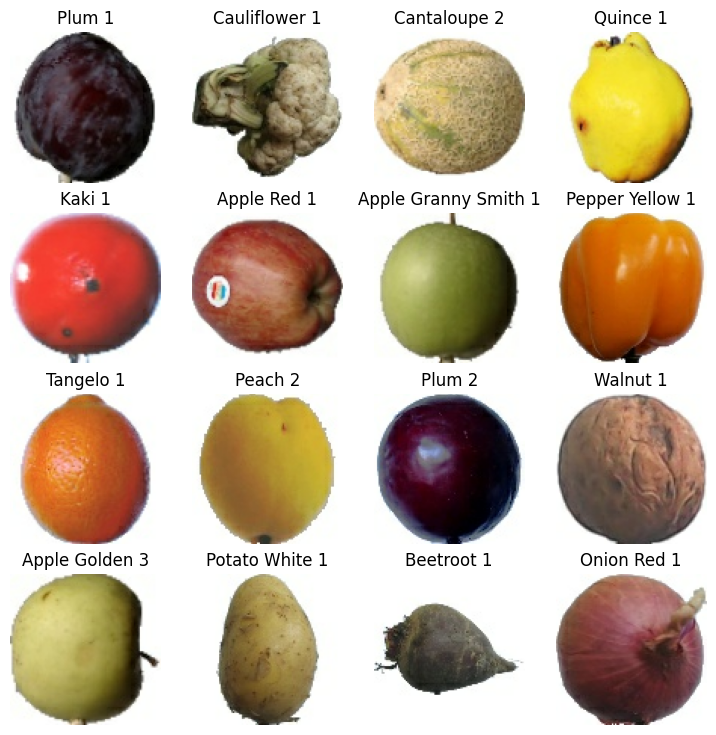

In [ ]:

plt.figure(figsize=(9, 9))#size of the white background
#get the data in a convienet format even though its more than i need
for images, labels in train.take(1):#this only "loops" for 1 itr
  print(images[0].shape)
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i])
    #labels are stored as float of probabiliy that image is of a class
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis("off")
plt.show()

In [ ]:
#train from scratch
model = tf.keras.applications.EfficientNetB0(input_shape=INP_SHAPE, include_top=False, weights=None)
print("total layers: "+str(len(model.layers)))
x = model.output # Get the output of the EfficientNetB0 model
x = tf.keras.layers.Dense(1024)(x)
x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(1024)(x)
x = tf.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(N_CLASSES, activation='softmax')(x)# Dense layer with 141 units and softmax activation for classification

model.trainable = True

# Create a new model with the classification head
model = tf.keras.Model(inputs=model.input, outputs=x)
model.summary() # to see the list of layers and parameters

total layers: 237


/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 100, 100, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 100, 100, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 100, 100, 3)    │              7 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 101, 101, 3)    │              0 │ normalization[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 50, 50, 32)     │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 50, 50, 32)     │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 50, 50, 32)     │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 50, 50, 32)     │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 50, 50, 32)     │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 50, 50, 32)     │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_expand         │ (None, 1, 1, 32)       │            288 │ block1a_se_reduce[0][… │
│ (Conv2D)             

 Total params: 6,555,440 (25.01 MB)

 Trainable params: 6,513,417 (24.85 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
#Same params as ResNet exeptt added a callback to cause the learning rate to have a more agressive reduction if the validation loss does not improve after 5 epochs
lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)
model.compile(optimizer=tf.keras.optimizers.AdamW(weight_decay=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy','Precision', tf.keras.metrics.F1Score(
    average='weighted')])

In [ ]:
train = train.prefetch(buffer_size=tf.data.AUTOTUNE)
val = val.prefetch(buffer_size=tf.data.AUTOTUNE)
test = test.prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
history = model.fit(train, epochs=EPOCHS, validation_data=val, callbacks=[lr_reducer])


Epoch 1/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 88s 79ms/step - Precision: 0.1484 - accuracy: 0.0350 - f1_score: 0.0254 - loss: 4.8803 - val_Precision: 0.0000e+00 - val_accuracy: 0.0063 - val_f1_score: 7.7640e-05 - val_loss: 7.9256 - learning_rate: 0.0010
Epoch 2/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - Precision: 0.2948 - accuracy: 0.1608 - f1_score: 0.1431 - loss: 3.3164 - val_Precision: 0.0000e+00 - val_accuracy: 0.0042 - val_f1_score: 3.4578e-05 - val_loss: 15.3525 - learning_rate: 0.0010
Epoch 3/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - Precision: 0.4597 - accuracy: 0.2920 - f1_score: 0.2752 - loss: 2.4511 - val_Precision: 0.0073 - val_accuracy: 0.0073 - val_f1_score: 1.0557e-04 - val_loss: 22.5638 - learning_rate: 0.0010
Epoch 4/30
126/126 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - Precision: 0.6275 - accuracy: 0.4488 - f1_score: 0.4331 - loss: 1.8623 - val_Precision: 0.0075 - val_accuracy: 0.0073 - val_f1_score: 1.5259e-04 - val_loss: 16.5593 - learning_rate: 0.0010
Epoch 5/30
126/1

# Results - Part 2 (EfficientNet)

The EfficientNet model ran for 175 seconds, and in 30 epochs the metrics became incredibly promising. Accuracy started at 0.0135 and finished at 0.9952.  
The memory metrics of the EfficientNetB0 model are as follows

Total params:

6,555,440 (25.01 MB)

 Trainable params: 6,513,417 (24.85 MB)

 Non-trainable params: 42,023 (164.16 KB)



The following few cells all contain the result metrics and graphs of the ResNet model.
Here we can see the accuracy, loss, precision and f1_score for each fold in the K-fold Cross Validation.

Over seven folds, accuracy stayed in the ranges of 0.97 to 0.988, loss stayed between 0.04 and 0.07, Precision stays between 0.98 and 0.99, and F1 score stays between 0.97 and 0.98 . No strong outliers are present here.

In [ ]:
scores_dict = cross_validation(model, test)
print(scores_dict['accuracy'])
print(scores_dict['loss'])
print(scores_dict['precision'])
print(scores_dict['f1_score'])

loop: 0
loop: 1
loop: 2
loop: 3
loop: 4
loop: 5
loop: 6
[0.984375, 0.9791666865348816, 0.9864583611488342, 0.981249988079071, 0.9854166507720947, 0.9885416626930237, 0.9770833253860474]
[0.05656861141324043, 0.09596432745456696, 0.057088807225227356, 0.07251905649900436, 0.049044784158468246, 0.04572010412812233, 0.07437624782323837]
[0.9874345660209656, 0.9801462888717651, 0.9874607920646667, 0.9843096137046814, 0.9874081611633301, 0.9906054139137268, 0.9801046848297119]
[0.9844292998313904, 0.9790487885475159, 0.9863837361335754, 0.9808487296104431, 0.9848031997680664, 0.9881816506385803, 0.9772735238075256]


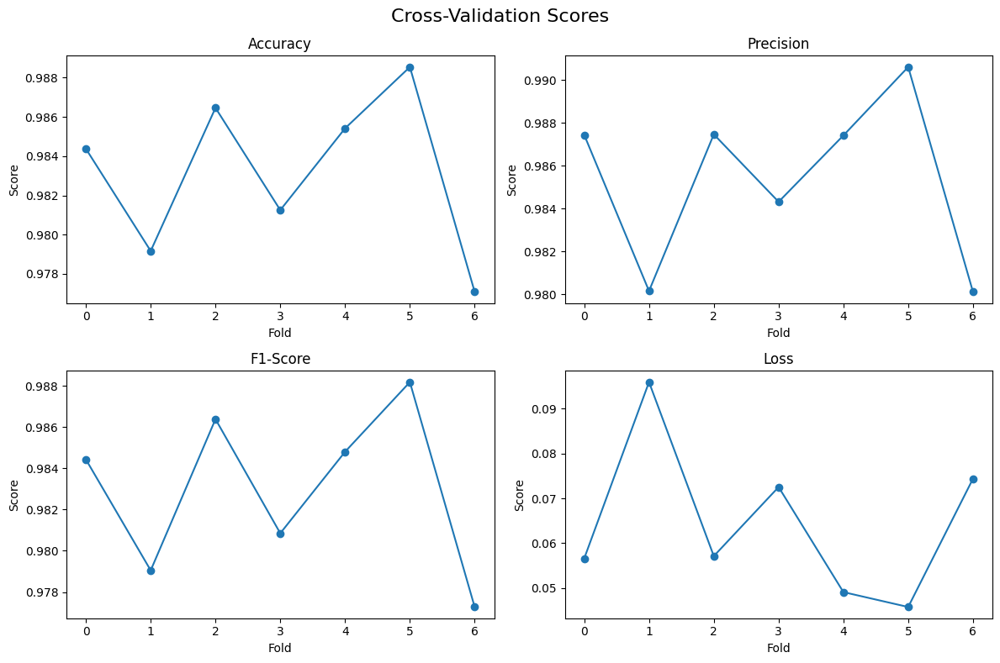

In [ ]:
plot_cross_validation_scores(scores_dict['accuracy'],scores_dict['precision'],scores_dict['f1_score'],
    scores_dict['loss'])

In [ ]:

text_stats(model,test)
print(history.history.keys())

Crossfold test averages:

Crossfold accuracy: 0.9831845249448504

Crossfold precision: 0.9853527886526925

Crossfold loss: 0.06446884838598115

Crossfold cf_f1_score: 0.9874476790428162
Test:

Test accuracy: 0.9854166507720947

Test precision: 0.9874476790428162

Test loss: 0.06926571577787399

Test f1: 0.9850009083747864

Train:

Train accuracy: 0.9952877163887024

Train precision: 0.9957805871963501

Train loss: 0.01718253642320633

Train f1: 0.9952778220176697

Overfit:

accuracy overfit: 0.009871065616607666

precision overfit: 0.008332908153533936

f1 overfit: 0.0102769136428833
dict_keys(['Precision', 'accuracy', 'f1_score', 'loss', 'val_Precision', 'val_accuracy', 'val_f1_score', 'val_loss', 'learning_rate', 'test_loss', 'test_accuracy', 'test_Precision', 'test_f1_score'])


## Training, Testing and Validation Graphs

Displayed below are the graphs for the training, testing and validation of the model, separate from the K-fold valiation. As seen, validation loss spikes before being reduecd drastically to almost zero. As with the ResNet-152 model, the accuracy, precision and f1 score are almost identical due to their strong correlation with eachother.

The accuracy, precision, and F1-score graphs are quite similar to eachother for both models. This is most likely due to the data being well balanced and the models' good performancse. The models seem to have achieved a good trade-off between precision and recall, and rather consistent results across different classes.


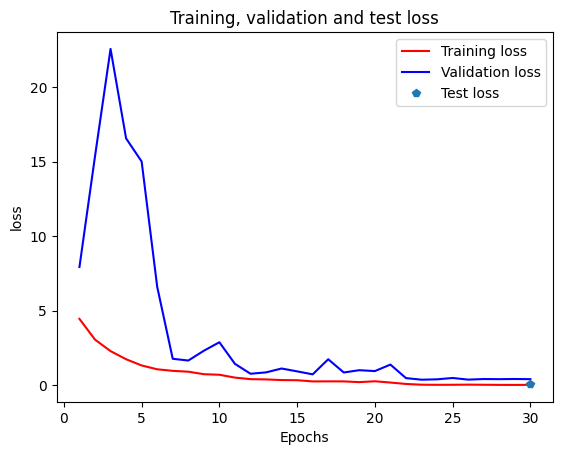

In [ ]:
plot_stats(history,'loss')

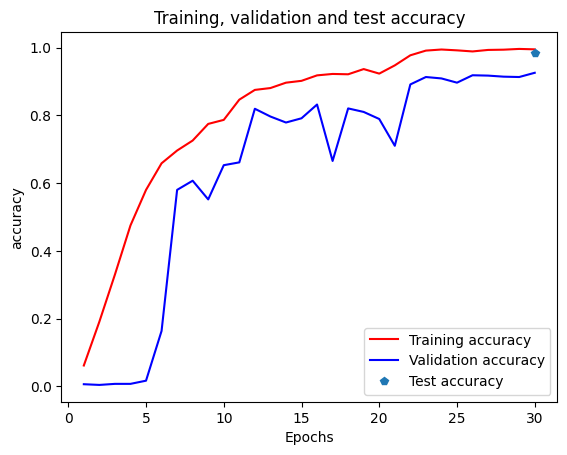

In [ ]:
#plot accuracies
plot_stats(history,'accuracy')

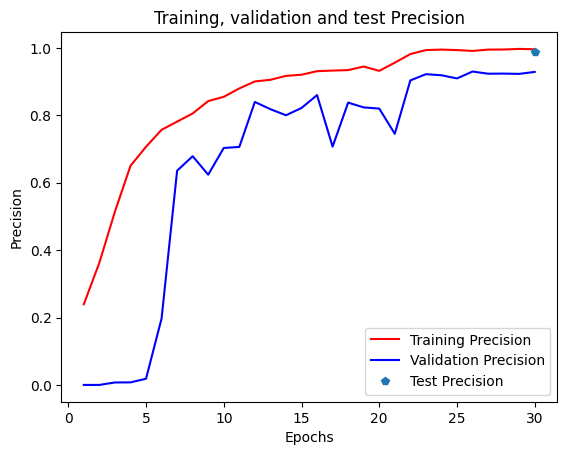

In [ ]:
#plot precisions
plot_stats(history,'Precision')

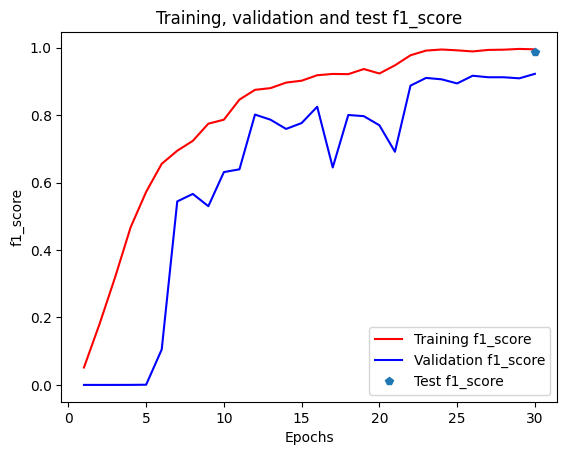

In [ ]:
plot_stats(history,'f1_score')

# Feature Map
The efficientnetb0 contianed less feature maps than the ResNet152 model, and we can see the model process more clearly due to the smaller number of layers allowing easier display of the metrics. We see how the model processes each image at each layer. By the end of the process, the image is a 4x4 grid of 16 pixels. It very quickly abstracts the features to an extreme degree, in only 52  convolutional layers they are much more abstract than the ResNet was at layer 80(the number we allowed it to display on its 512 total conv layers)

54
54
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


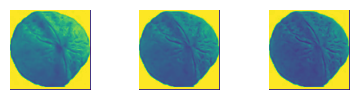

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


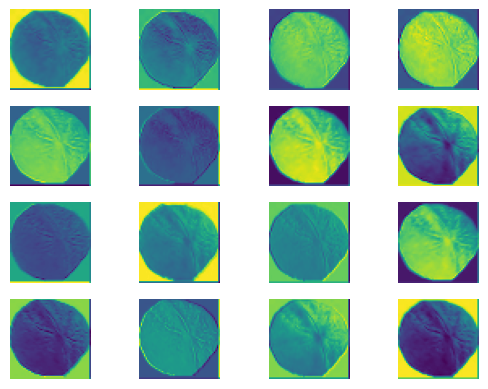

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


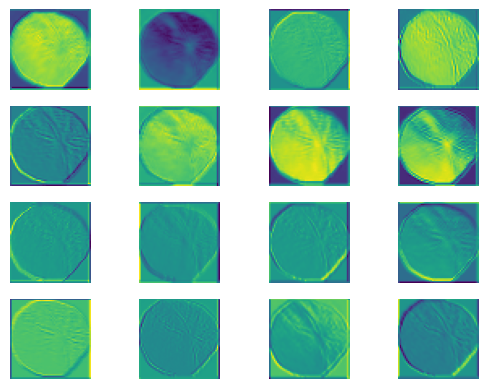

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


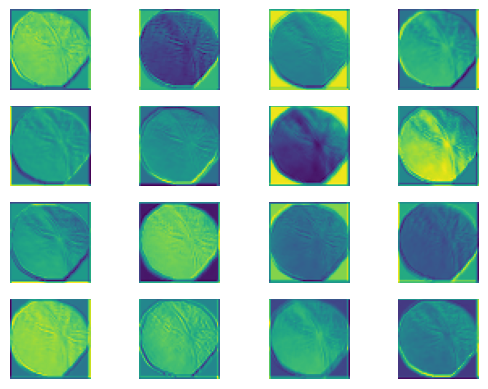

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step


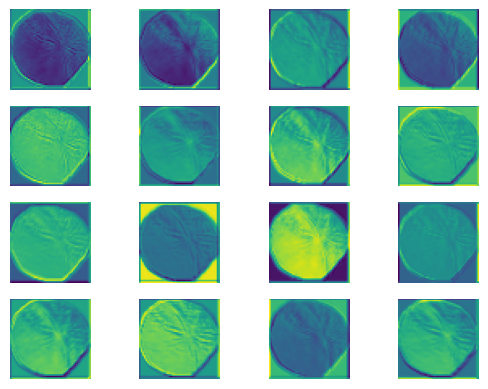

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step


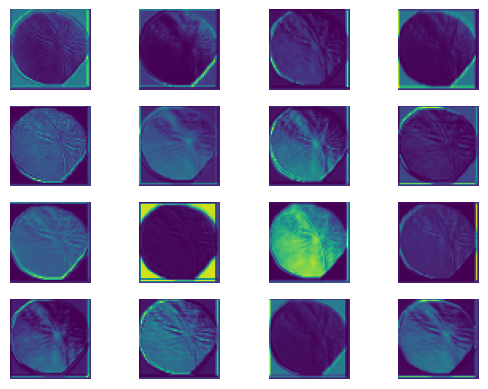

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


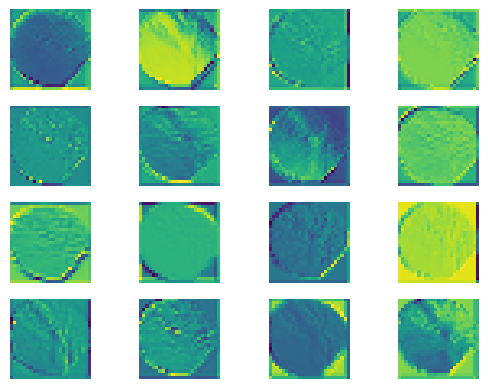

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


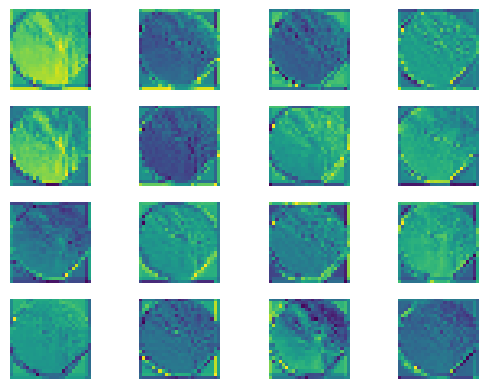

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 982ms/step


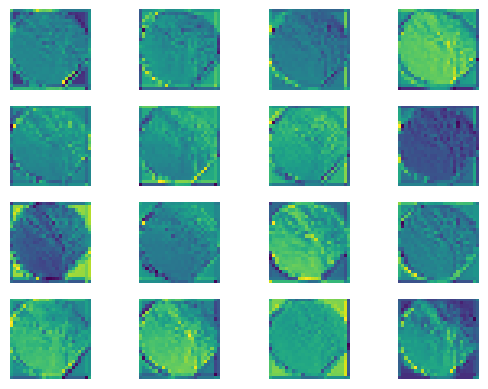

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


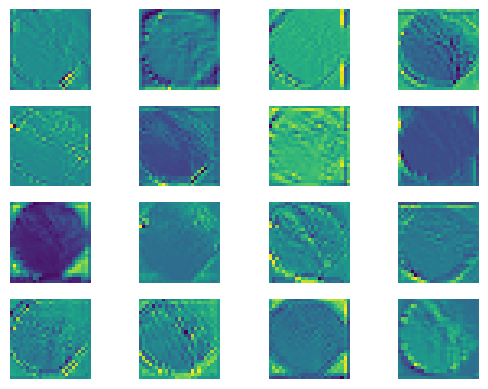

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


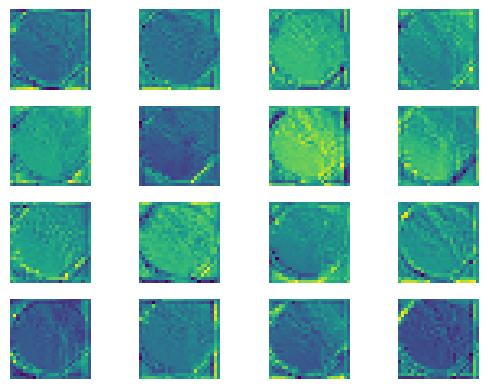

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


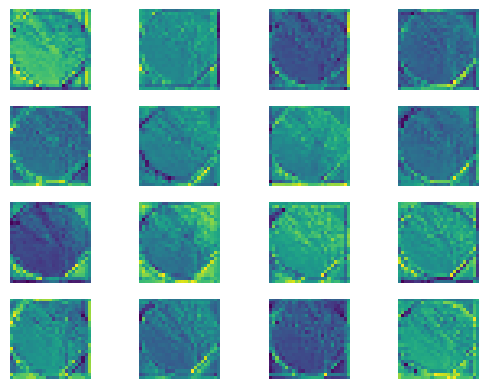

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


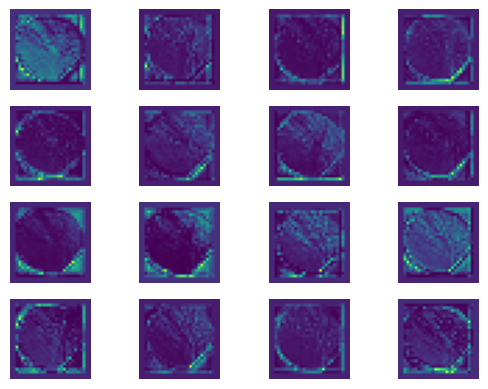

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


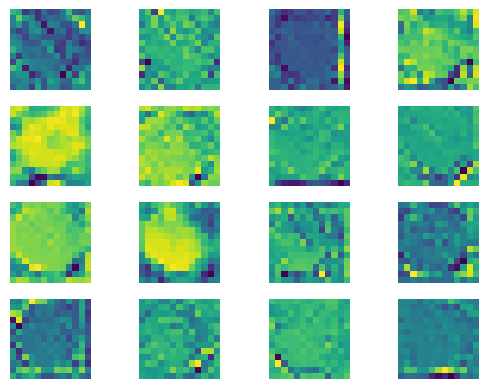

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


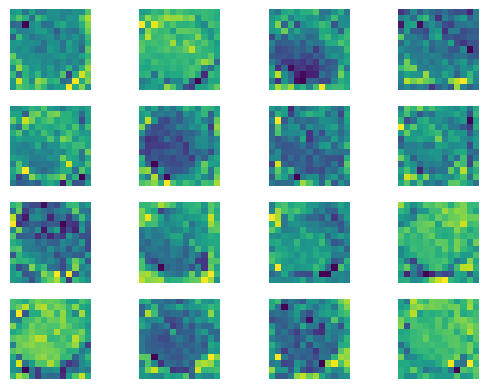

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


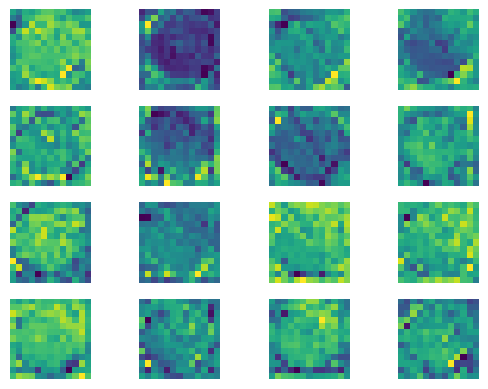

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


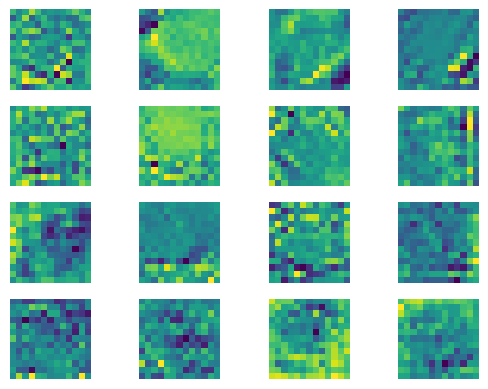

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


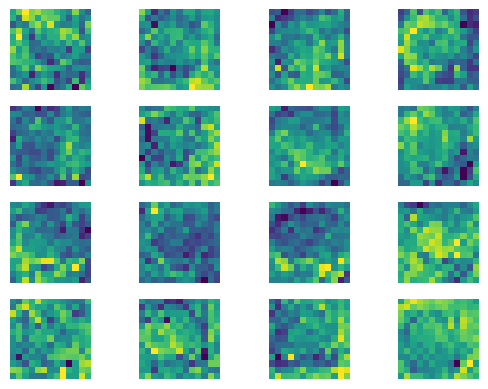

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


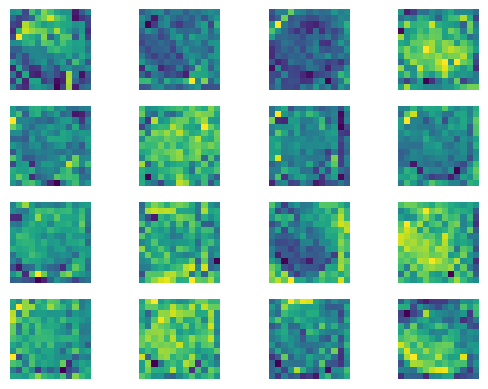

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


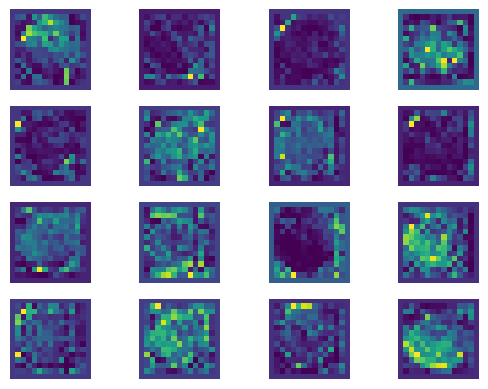

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


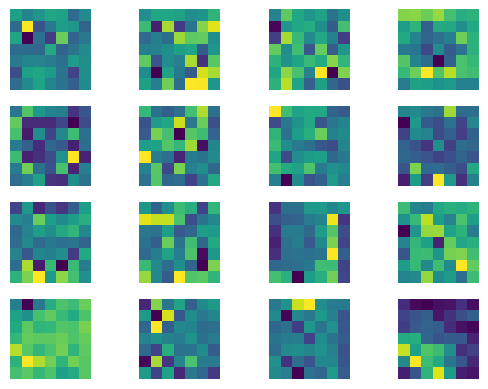

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


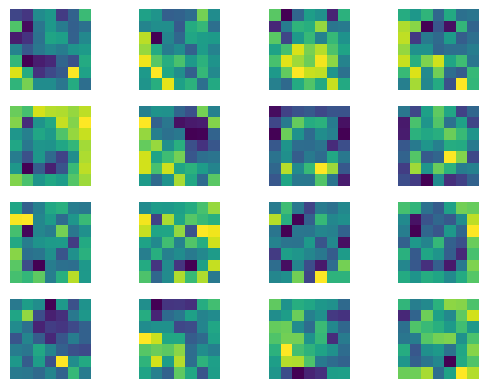

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


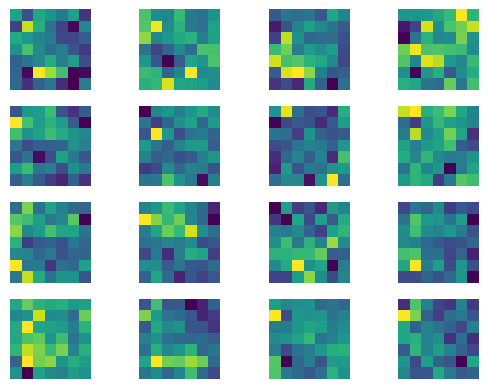

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


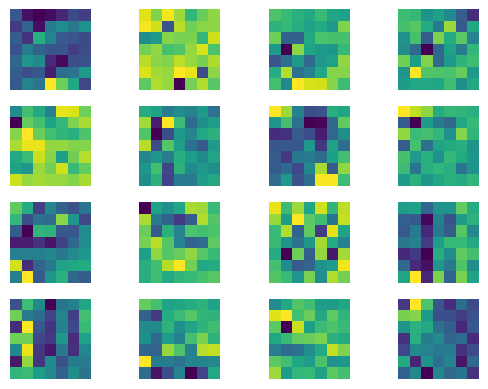

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


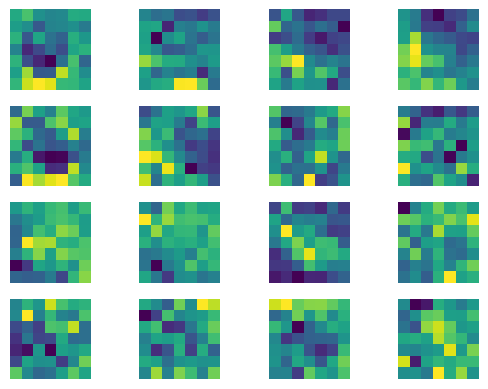

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


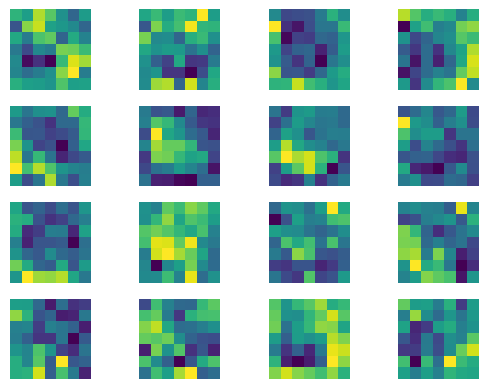

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


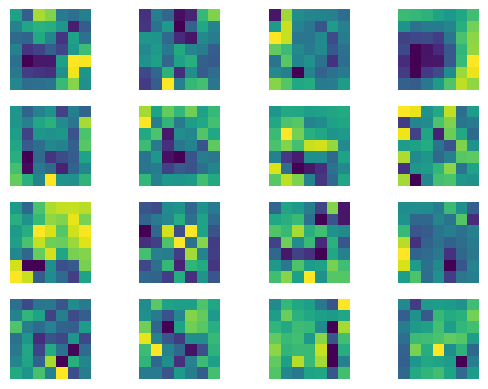

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


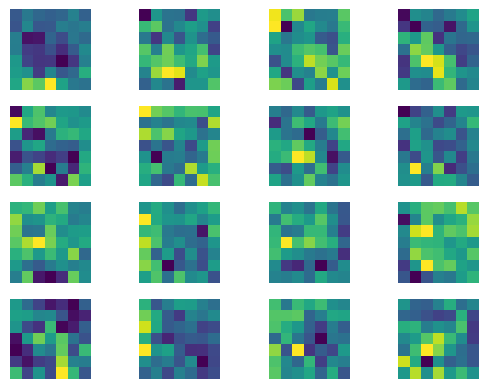

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


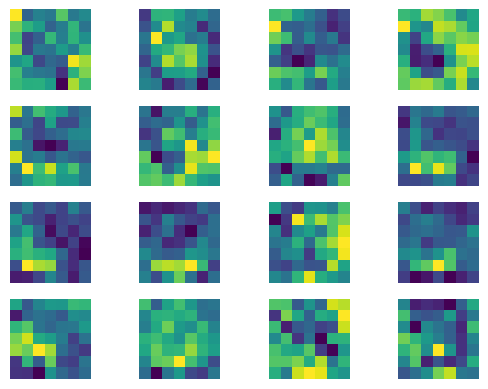

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


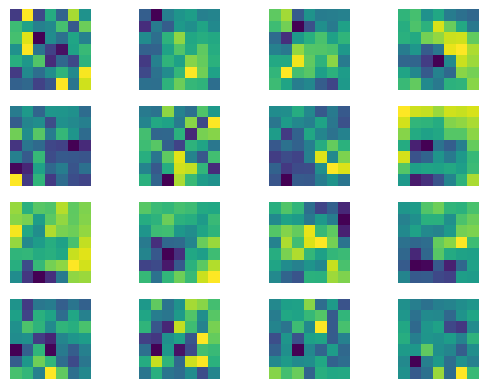

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


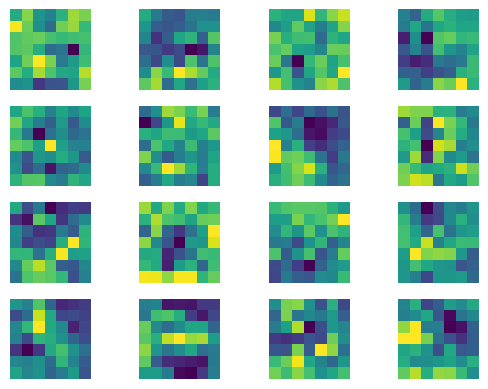

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


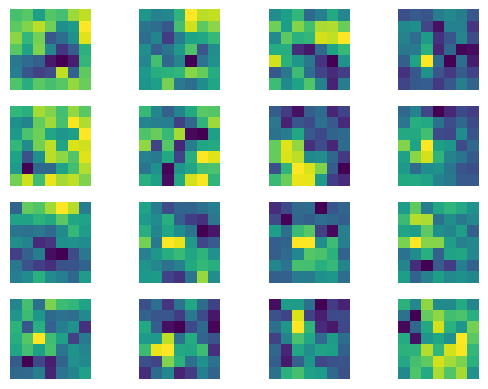

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


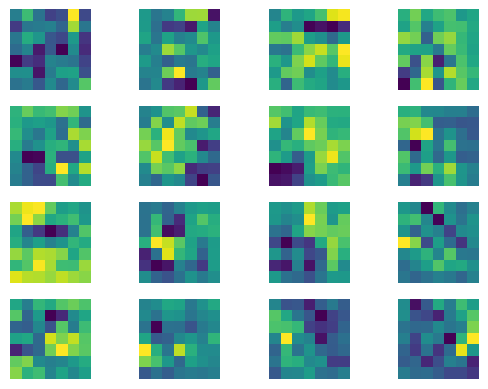

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


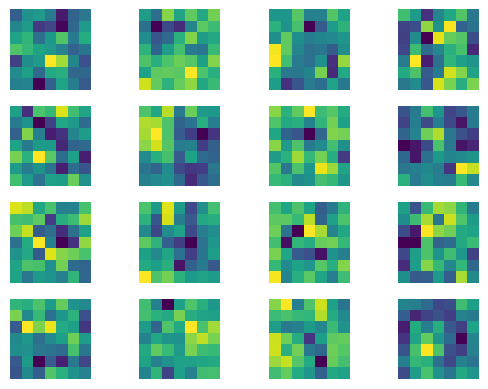

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


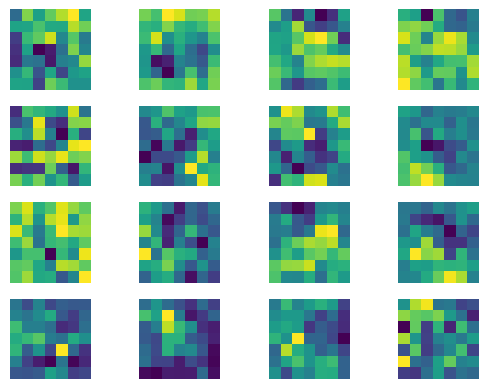

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


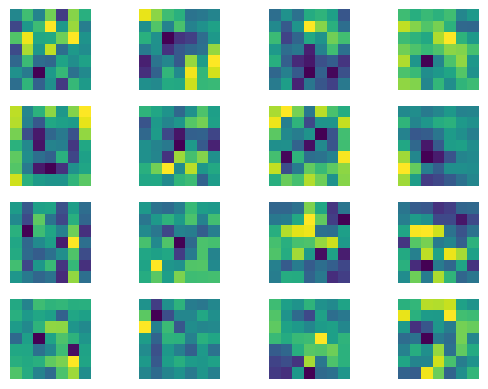

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


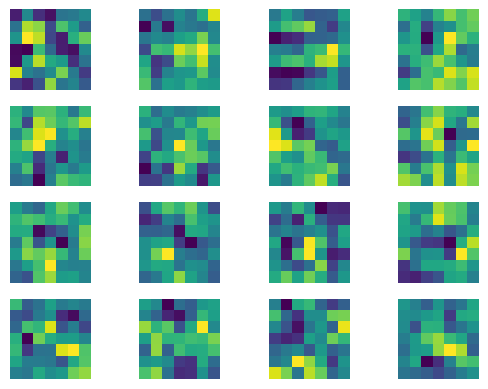

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


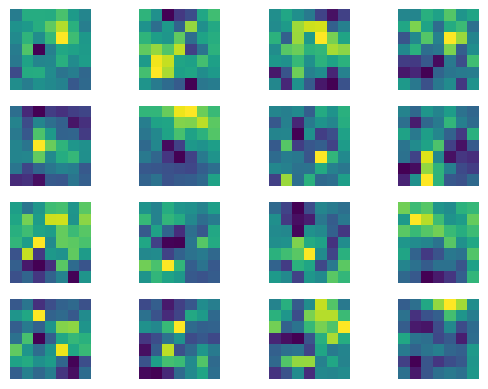

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


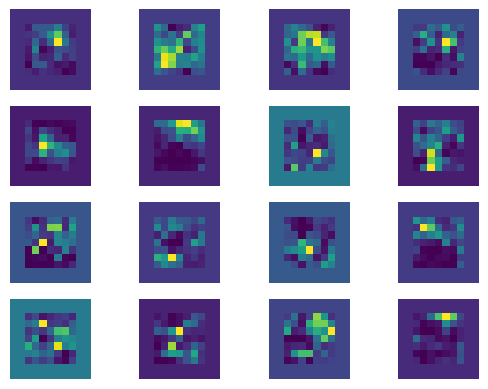

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


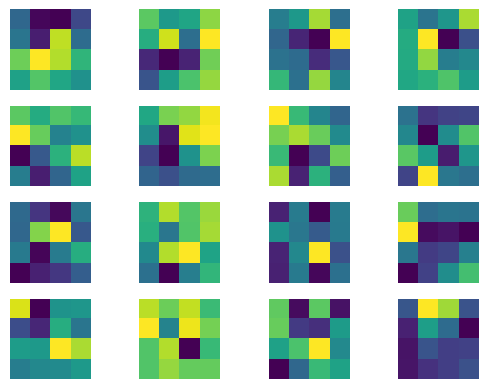

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


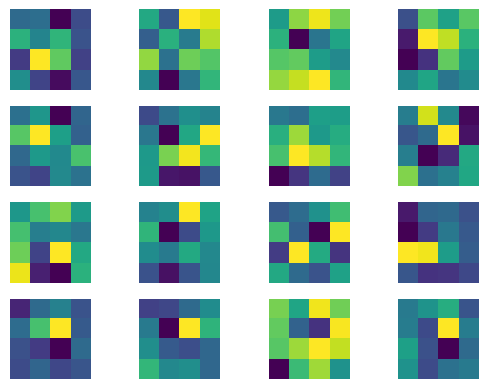

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


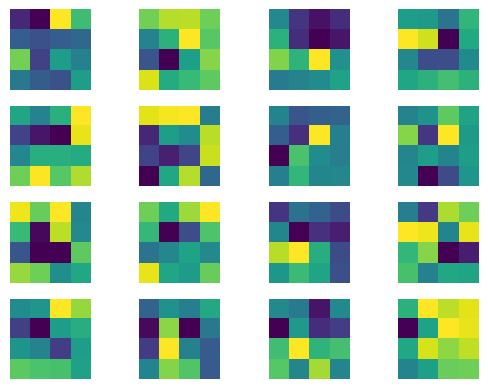

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


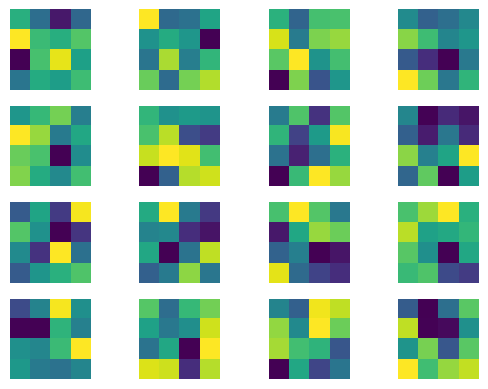

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


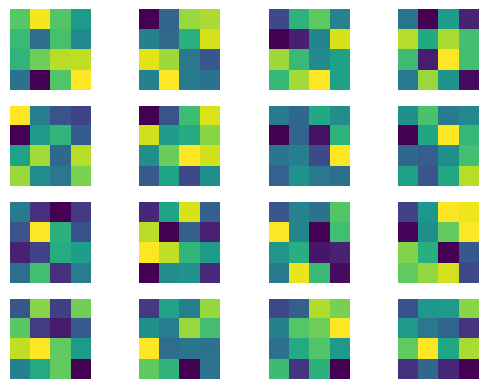

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


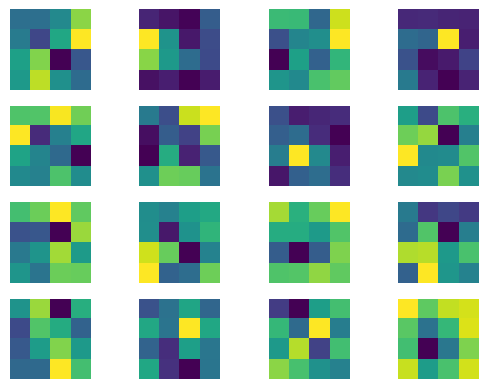

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


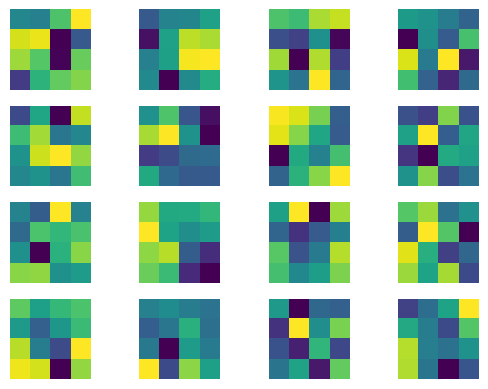

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


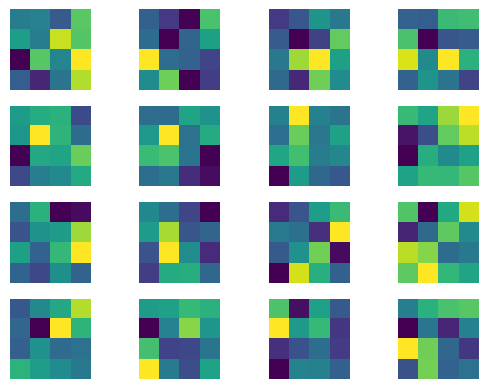

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


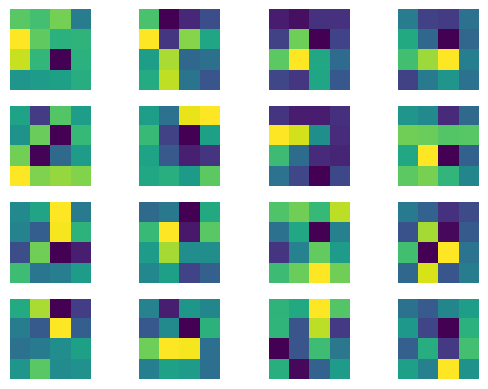

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


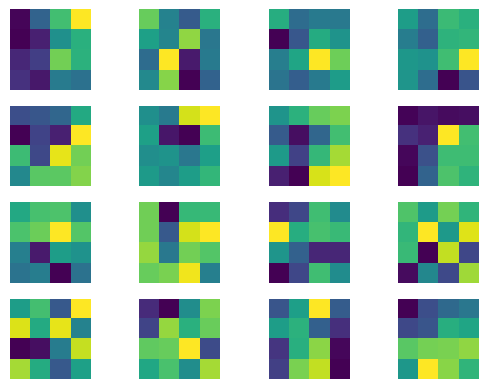

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


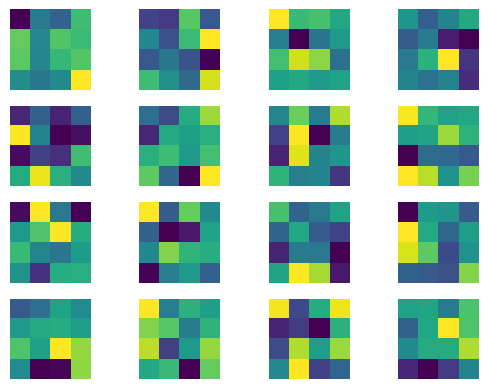

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


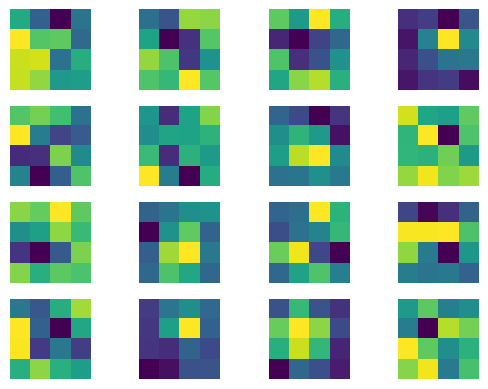

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


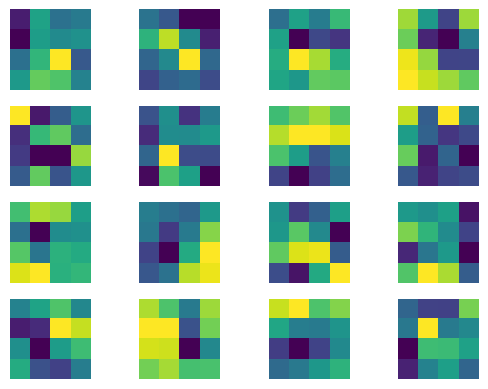

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


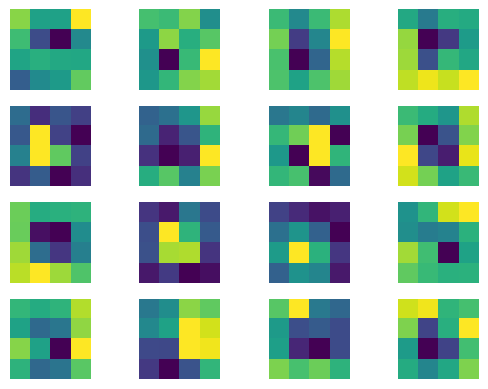

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


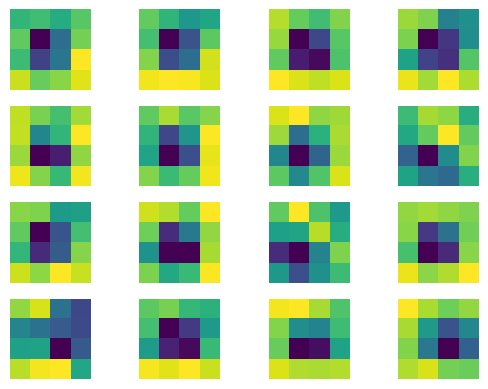

In [ ]:
get_feature_maps(model,test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


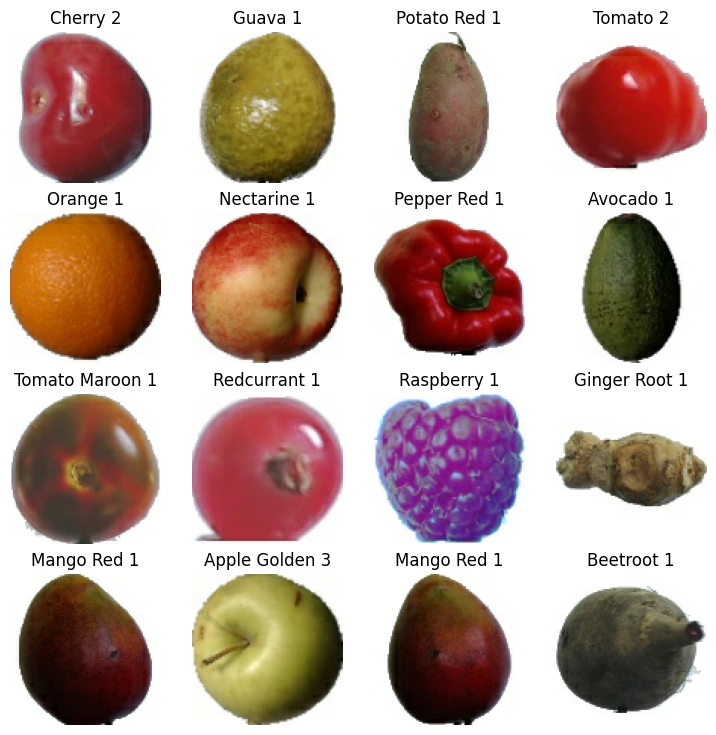

In [ ]:

visualize_predictions(model,test)

In [ ]:
y_true_classes, y_pred_classes = calc_conf_matrix(model,test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━

# Confusion Matrix
There are very few misclassifications in the EfficentNetB0 confusion matrix, the only significant repeated misclassifications are within the apple classes, and marajucas being misclassified as lemon mayaers, and 8 potato sweets being misclassified as potato reds, which can be assumed to be because of their extremely similar appearances.

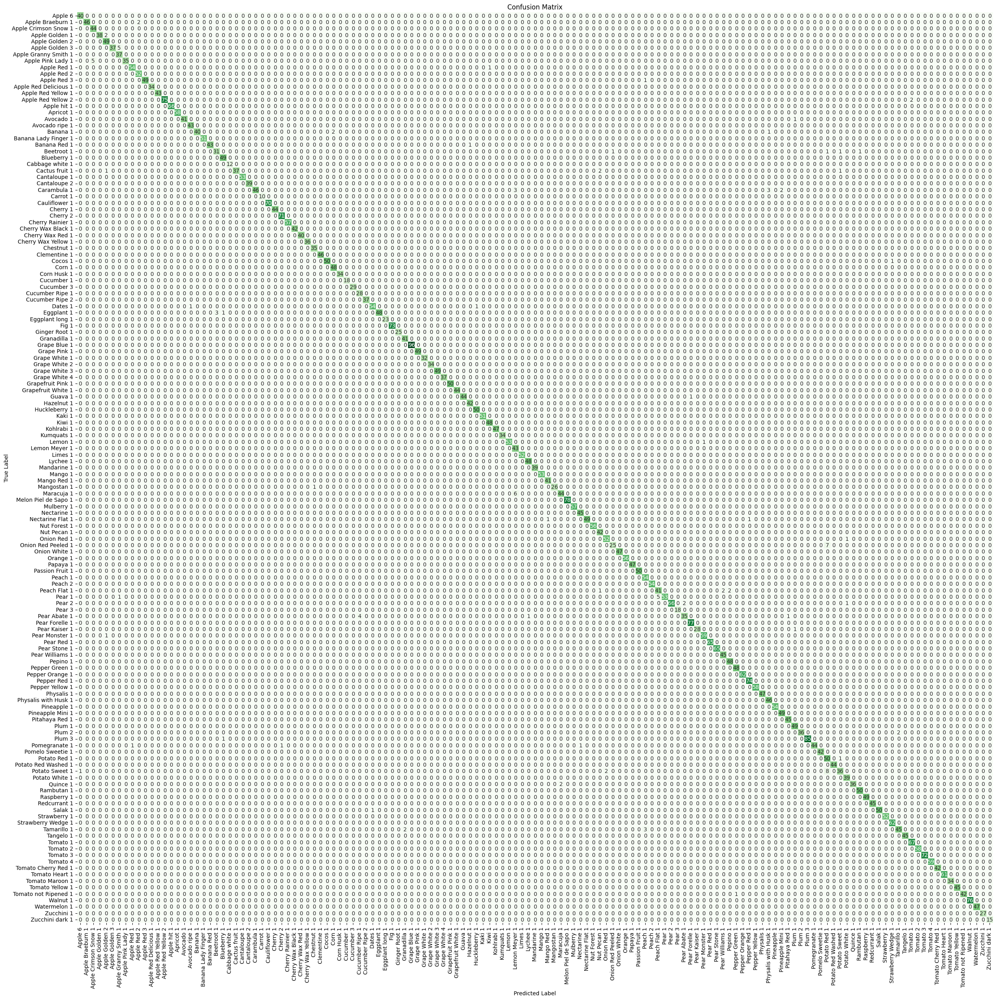

In [ ]:

plot_conf_matrix(y_true_classes, y_pred_classes)

#Evaluation of the results

We made sure to keep both preconditions for each model identical. This included number of epochs, data sets, batch sizes and cardinalities of the training/testing/validation sets. This ensured any differences between the outputs would solely be a result of the two models differences.

## Main Observations
The ResNet152 model trained much slower than the EfficientNetB0 model. ResNet152 trained for 605 seconds with 30 epochs, while EfficientNetB0 trained for just 175 seconds. This is likely a result of the inherent natures of the two models. ResNet152 is a model designed to deal with increidbly deep and complex datasets, and EfficientNetB0 is a model designed with the goal of maximising speed and efficiency without much tradeoff in accuracy.

Despite the ResNet152 training for much longer, it showed significantly worse results across the board.  The following images are the ResNet152 graph (first) and the EfficientNetB0 graph (second). It is immediately clear that the ResNet152 accuracy, precision and f1 underperformed compared to the EfficientNetB0 model. The real difference is in the loss function. ResNet152 loss was always in the range of 0.4 to 0.55, with an outlier of 0.72. EfficientNetB0's loss function was always between 0.05 and 0.09. This is a massive improvement compared to the ResNet152 performance.
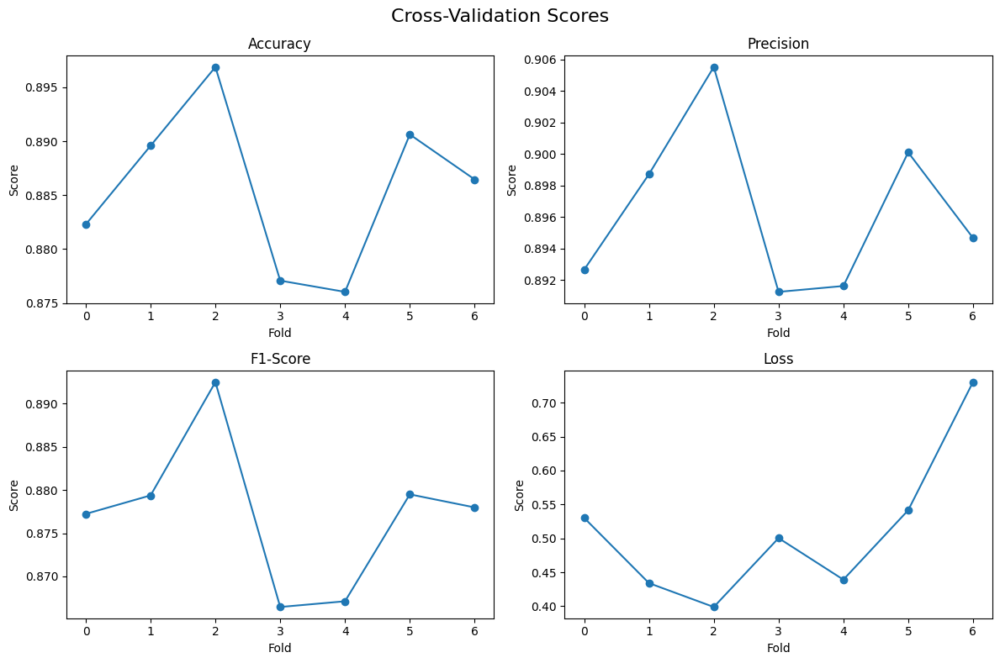

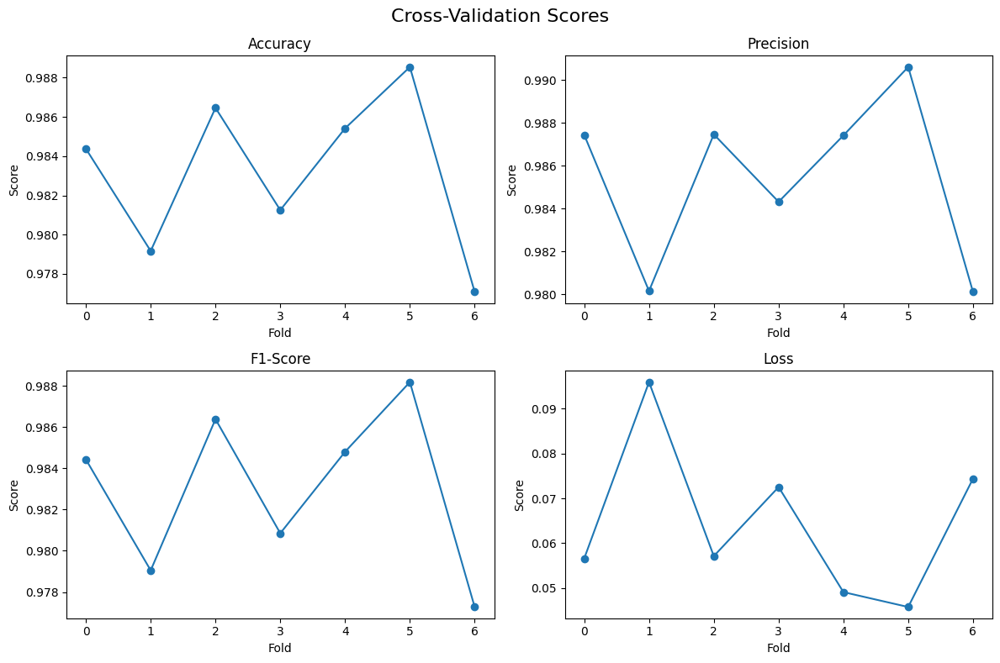

Additionally, we can compare the two confusion matrixes to see how each model did in terms of prediction ability. The first graph is the confusion matrix for ResNet152, and the second graph is the confusion matrix for EfficientNetB0.

Both models are very well trained, and there is a strong diagonal line indicating that most predictions for both models were indeed correct.
However, it is also clearly apparent that ResNet's Confusion matrix is much more flawed than EfficientNet. There are clear batches of incorrect predictions, such as with Grapefruit White and Tomato Yellow, and Cherry 2 with Cherry Rainier.
These are almost always a result of two classes of fruit looking almost identical in size, shape, color etcetera.


EfficientNetB0's Confusion matrix is much stronger, with only a few tiny outliers of incorrect predictions.
It was capable of predicting almost every label correctly, leading to a strong diagonal line with almost all data points save for a handful being in this data line.
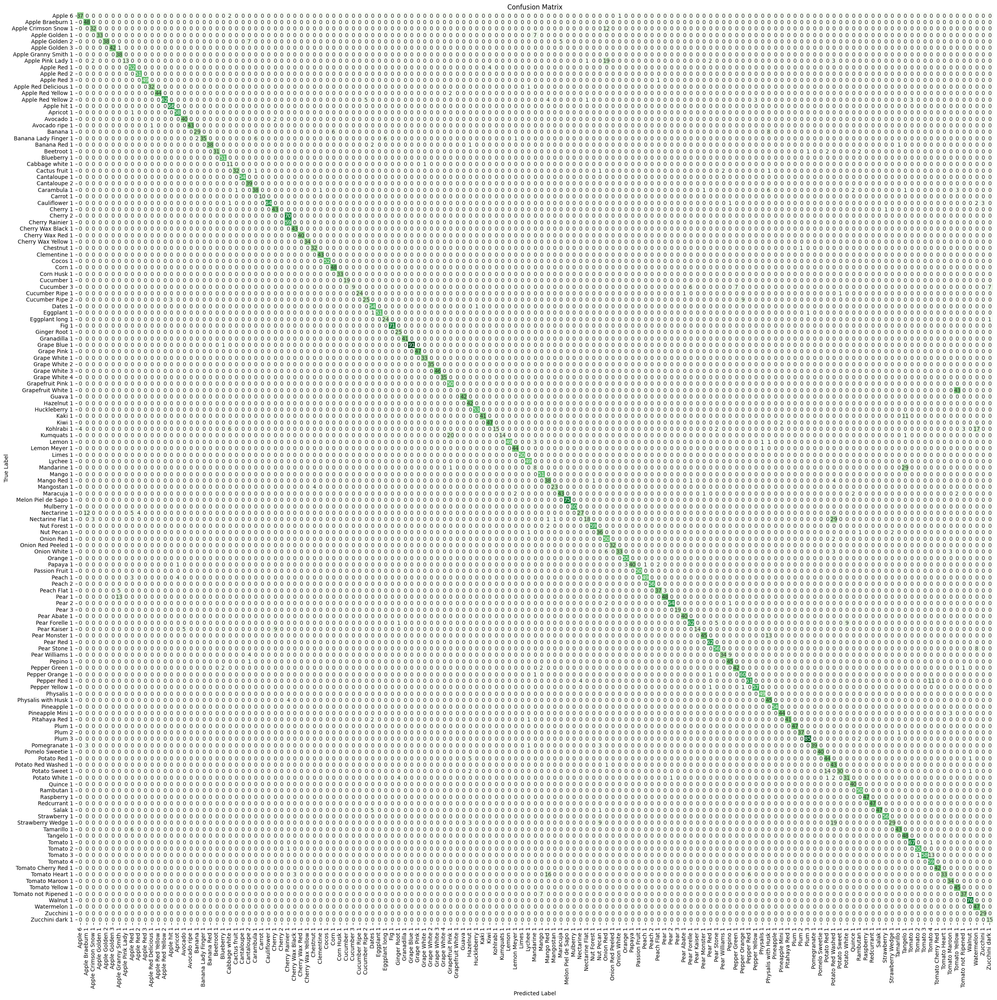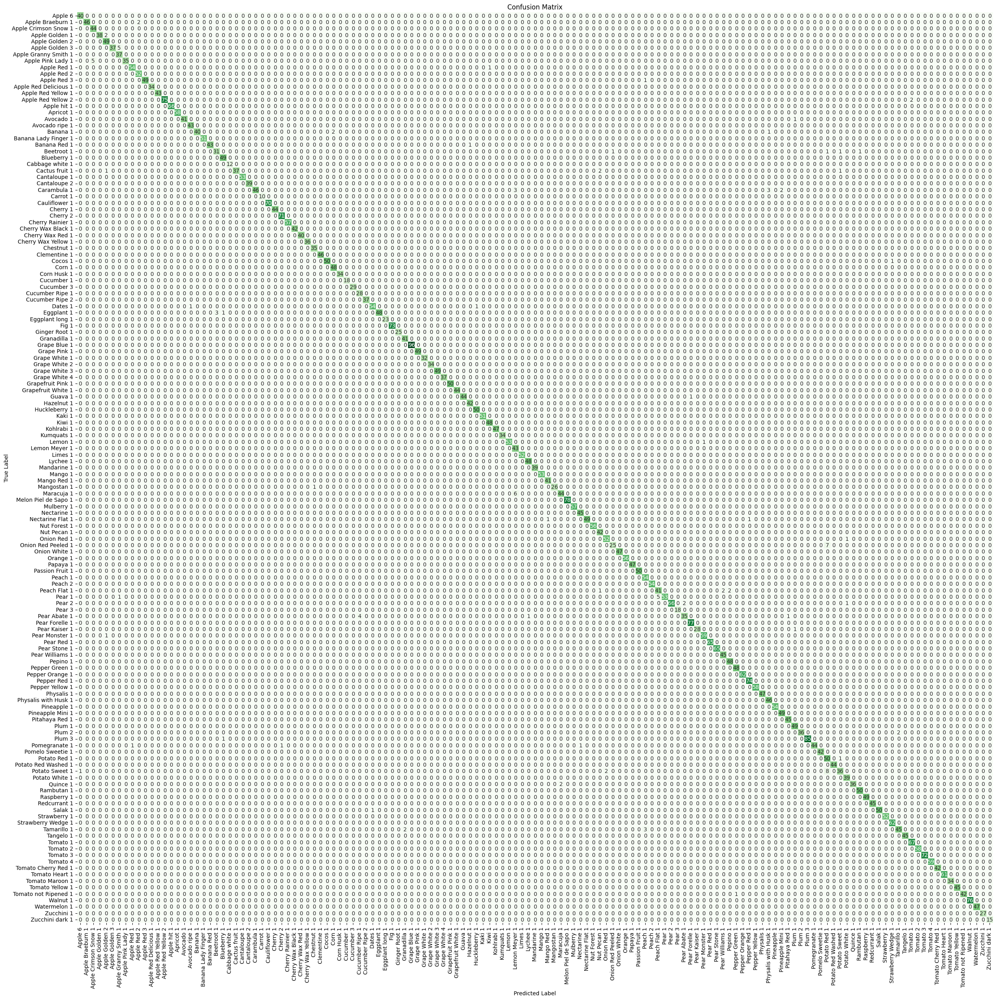

It is evident that ResNet152 underperformed compared to EfficientNetB0, despite ResNet152 taking almost three times as much time and ten times as much memory. (605 seconds vs 175 seconds) ( 235.23 MB vs 24.85MB)

The main reason we believe ResNet152 underperformed is that it simply didn't have a complex and deep enough data set for its strength to prevail.
We preprocessed the data so that only a fraction of the incredibly large dataset was taken in at any one time. This method of preprocessing absolutely benefitted EfficientNetB0 over ResNet152.

It is evident that overall, both models were able to accurately predict fruits at high rates > 90%.  EfficientNetB0 preformed significantly better due to the smaller data sizes and efficient nature of its architecture. Resnet152 showed clear potential and promise during its epochs to bec able to process incredibly large amounts of data incredibly accurately, but ultimately did not reach the same level of precision as EfficientNetB0.
https://www.geeksforgeeks.org/efficientnet-architecture/


EffecientNetB0 is usually compared with ResNet50 as they are both the smallest variants of their model familys but for this test the results were more interesting with resnet 152. As you can see in this graph ResNet-152 outpreforms EffecientNetB0 on the more complex imagenet dataset
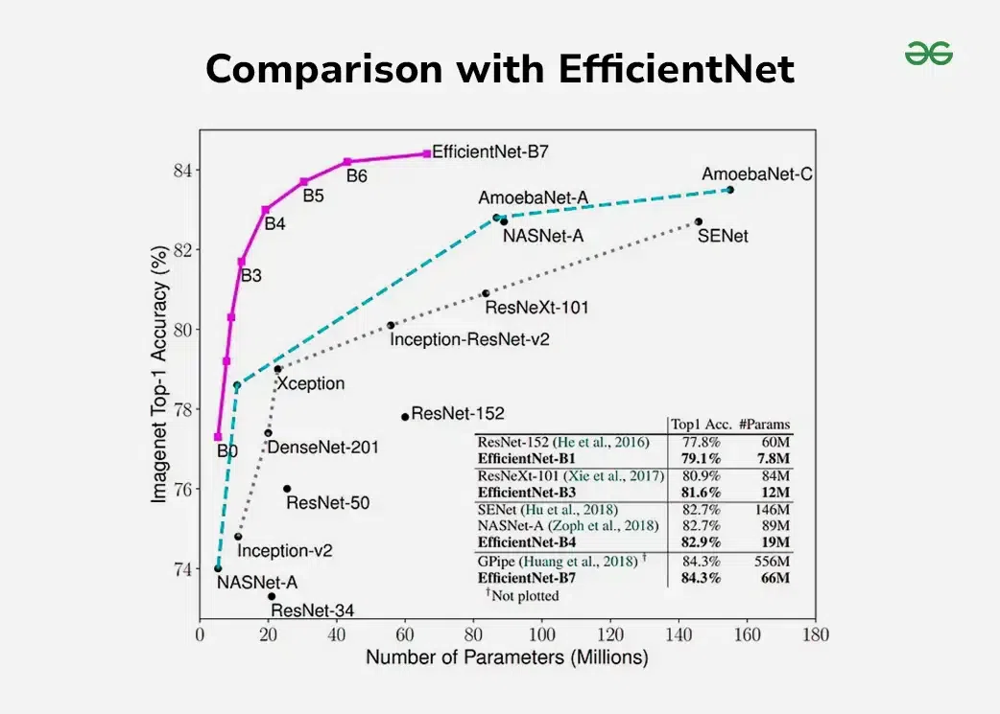

## References:
  #https://www.kaggle.com/datasets/moltean/fruits
  #https://www.run.ai/guides/deep-learning-for-computer-vision/pytorch-resnet
  #https://towardsdatascience.com/complete-architectural-details-of-all-efficientnet-models-5fd5b736142
  #https://machinelearningmastery.com/how-to-manually-scale-image-pixel-data-for-deep-learning/
  #https://www.geeksforgeeks.org/efficientnet-architecture/